###### OBJECTIVE
The objective of this program is to create analytical data from the raw sequences of the proteins. Numerous files will be created to allow analysis of sequences by geographic region and analysis on the impact of laws and regulations concerning COVID-19. Multiple Sequence Alignment will allow researchers to find gaps or variation in the sequences, and phylogenetic trees will show the relation of variants and which variant is dominating a given population.

###### MATERIALS AND METHODS

Libraries used for this program include: Bio for biopython and re for python's regular expressions library, and Clustalw command line. Programs and interfaces used are SeqIO, AlignIO, Bio.Align.Applications, and Phlyo. Clustalw must be installed on the user's personal computer in order for the program to run.

###### User Input
Under the comment '"CONSTANTS":', the user must input the path of the location of the surface glycoprotein sequences, the surface glycoprotein receptor binding sequence, and the path for where files should be saved. A variable for the Clustalw path is also created, and the user must enter the path there. 

USERPATH < - path to folder where user wants to save files

CLUSTALPATH < - path of where the clustalw program lives on users' personal computer

ALLSURFGLYCPATH < - path of the surface glycoprotein sequences file

SURFACEGLYCPATH <- the surface glycoprotein receptor binding sequence

###### Lists
Lists were made for states, regions, and separate categories that contain the state initial applicable to the region or category. These lists will be used to separate the files accordingly.




###### OVERVIEW OF EACH FUNCTION
###### pullState(description)
This function takes the description string in the fasta sequences and splits it into a list. After the list has been made, it returns the item at index four, which is the state initials. 


###### formatDescription(description)
The desired description format in the assignment pdf and the format of the description in the given sequence file are different. Therefore, to fit the style of the description in the assignment, this function rearranges the order of the description string by splitting it into a list. After the list is created, a new string is made by concatenating items in the list into an order that fits the desired format. The created string is then returned.


###### findRBD(seq, rbdPatternFile)
This function opens the file with the receptor binding domain sequence, and isolates the sequence from the definition line. The function then looks at another given sequence (the argument ‘seq’), and uses the regular expression search() function to find the best matching rbd sequence in the given sequence. It returns the rbd sequences found in the given sequence.


###### makeMSAwithClustal(pathToFasta, regionOrStateFile)
Clustalw is a separate command line program that can be called by python via the Bio.Align.Applications program. This function writes to the command line with the infile created by the user path and name of unaligned fasta file. After the command line call, the program will automatically produce the alignment file and phylogenetic tree file. After these files are generated, this function will print the .aln file and draw a tree using the Phylo.draw() function.


###### makeSmallDataFileMSA(pathToBaseFile, regionOrStateFile)
This function has three main jobs. First, it creates a smaller version of each file by limiting it to only 100 sequences. This allows for faster alignment and runtime to fit the assignment deadline. The second job is to use the findRBD function and pull the receptor binding domain from the sequence. Once the receptor binding domain is found, the program will write that to the new file. The final job is calling the makeMSAwithClusta function, which will take the new file made and create the alignment and Phylogenetic tree files. 


###### makeIndividualStateFiles(pathToBaseFile)
Calling this function will split the COVID-19 surface glycoprotein sequences into 50 files for each individual state. It will iterate through the COVID-19 surface glycoprotein sequences file using SeqIO parser and will open and write to a new file named after the state.


###### makeRegionalFiles(pathToBaseFile)
Calling this function will split the COVID-19 surface glycoprotein sequences into 6 files for each region. It will iterate through the COVID-19 surface glycoprotein sequences file using SeqIO parser and will open and write to a new file named after the state.


###### makeCategoryFiles(pathToBaseFile)
Calling this function will split the COVID-19 surface glycoprotein sequences into 4 files for each category. It will iterate through the COVID-19 surface glycoprotein sequences file using SeqIO parser and will open and write to a new file named after the state.


###### makeFiles(pathToBaseFile)
Calling this function will activate all the aforementioned functions and begin the program process.

In [95]:
from Bio import SeqIO
import re

#"CONSTANTS":

#PATHS: Change to fit desired location/output of computer:
USERPATH = "C:\\Users\\17408\\OneDrive\\Desktop\\ProblemSolvingFinal\\"
CLUSTALPATH = "C:\Program Files (x86)\ClustalW2\clustalw2.exe"
ALLSURFGLYCPATH = "C:\\Users\\17408\\Downloads\\AllSurfaceGlycoproteinSeqs.fasta"
SURFACEGLYCPATH = "C:\\Users\\17408\\Downloads\\surfaceGlycoprotein_sars2.fasta"

#regions: definded by: https://www.businessinsider.com/regions-of-united-states-2018-5#lastly-the-petroleum-administration-for-defense-uses-this-map-of-five-regions-originally-drawn-up-in-1942-to-ration-the-countrys-gasoline-10
#as lists for better view:
NORTHEAST = ["ME", "VT", "NH", "MA", "CT", "RI", "NY", "NJ", "PA", "MD", "DE"]
SOUTHEAST = ["WV", "VA", "NC", "SC", "GA", "FL", "MS", "AL", "TN", "KY"]
SOUTHWEST = ["AZ", "NM", "TX", "AR", "LA"] #https://en.wikipedia.org/wiki/Southwestern_United_States
MOUTAIN = ["MT", "ID", "CO", "UT", "WY"]
MIDWEST = ["MI", "OH", "IN", "IL", "WI", "MN", "IA", "MO", "ND", "SD", "NE", "KS", "OK"]
PACIFIC = ["WA", "OR", "CA", "NV", "AK", "HI"]


#categories
#as lists for better view:
NOMASKS = ["AZ", "FL", "GA", "ID", "MO", "NE", "OK", "SC", "SD", "TN"] #static
LIMITOUTDOOR = ["CA", "CO", "CT", "DE", "HI", "ME", "MA", "MI", "NJ", "NY", "NC", "PA", "VT"] #static
LOWVAX =["ID", "WY", "MI", "WV", "LA", "AL", "IN", "TN", "ND", "OH"] #static
HIGHVAX = ["VT", "RI", "ME", "CT", "MA", "NY", "NJ", "MD", "VA", "WA", "NH", "OR", "NM", "CA", "CO", "MN"] #static

STATELIST = ["AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA", "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD", "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY"]



#__________________________________________________HELPER FUNCTIONS_________________________________________________

#isolate state from description line
def pullState(description):
    descriptionList = description.split("|") #break description line into a list
    state = descriptionList[4] #the state initials are located index 4 in the list
    return state

#
#
#
#

#function to correct formatting of description string and returns new description string:    
def formatDescription(description):
    
    descriptionList = description.split("|") #<---- break string apart into a list
    #print(descriptionList) to see if list was made correctly
                
    #format description string to look like: ">RBD_UDW38231.1|surfaceglycoprotein|TX|GenBank|ssRNA(+)'
                                               #write in + 0 |    write in       |4|    2   |   1  < --- numbers are indexes of the words in list
    
    newDescription = ">RBD_{A}|surfaceglycoprotein|{B}|{C}|{D}".format(A = descriptionList[0], B = descriptionList[4], C = descriptionList[2], D = descriptionList[1])
    return newDescription

#
#
#
#

def makeSmallDataFileMSA(pathToBaseFile, regionOrStateFile): #< -- take the input original file and new file path, and target state info 
    
    #open new file and incorporate the base file to read
    newPath = open(str(USERPATH) + str(regionOrStateFile)+ "100.fasta", mode = "w")
    with open(pathToBaseFile, mode = "r") as handle:

        i = 0
        for item in SeqIO.parse(handle, "fasta"):
            description = item.description   #<---- description format in the original fasta file is UDWnumber | ssRNA(+) | GenBank | USA: Texas | TX
            sequence = item.seq
            rbdSeq = findRBD(sequence, SURFACEGLYCPATH)
            
            if i < 100:
                newPath.write(">{A}\n{B}\n".format(A = description, B = rbdSeq))
                i += 1
    
    newPath.close() # <-- close file so no interference
    handle.close()
    
    createdFastaFile = str(USERPATH) + str(regionOrStateFile)+ "100.fasta"
    makeMSAwithClustal(createdFastaFile, regionOrStateFile)
    
    #open the file again as a random variable, call the makeMSAfunction to return .dnd and .aln
    #make a draw tree function as well and use the dnd file to draw trees
    #close all the files

#
#
#
#

#function to find the RBD pattern in the sequences
def findRBD(seq, rbdPatternFile):
    
    #open rdbPatternFile
    rbdFile = open(rbdPatternFile, mode = "r")
    
    #pull infromation from file and make it into one string: 
    information = "" #<--- make empty string to save information to
    for i in rbdFile:
        information += i #<--- concatinate file information to empty string
    #print(information) to see resulting string
    
    
    #remove new lines and sequence from information string:
    rbdList = information.split("\n") #<--- remove the new lines (\n) from the string
    rbdJoin = "".join(rbdList) #<--- join the string together again without new lines
    rl = rbdJoin.split("]") #<--- split into a new list where the definition line ends at "]"
    rbdSeq = rl[1] #<---pull the protein sequence from the list, it is the second item (index 1)
    #print(rbdSeq) to see if we have the correct sequence
    
    
    #remove new lines form seq:
    seqList = information.split("\n") #<--- remove the new lines (\n) from the string
    stateSeq = "".join(seqList) #<--- join the string together again without new lines
    #print(stateSeq) to see if we have the correct sequence
    
    
    #compare the rbd seq to sequence found in the fasta file:
    domainMatch = re.search(rbdSeq, stateSeq) #<--- looking for exact match of all characters from the rbdomain string in the protein sequence
    returnSeq = domainMatch.group()
    
    if domainMatch == None: #<--- if no exact match found, follow pipeline below
        
        # use or method on L&R , and T&K to find alternate patterns of rbd string if there was no exact match
        newDomainMatch = re.search("RVQPTE.*NKCVNF", stateSeq) 
            
        if newDomainMatch != None: #if partial matches are found:
            #print(newDomainMatch.group()) to see what the result is
            returnSeq = newDomainMatch.group() #reset spanMatch to span of the nonexact match
    
            
    rbdFile.close()
    return returnSeq

#
#
#
#

#multiple seq alignment
import os
import subprocess
import Bio
from Bio import AlignIO
from Bio import Phylo
from Bio.Phylo.TreeConstruction import DistanceCalculator 
from Bio.Phylo.TreeConstruction import DistanceTreeConstructor

from Bio import SeqIO    

import Bio.Align.Applications
from Bio.Align.Applications import ClustalwCommandline

import matplotlib
import matplotlib.pyplot as plt

def makeMSAwithClustal(pathToFasta, regionOrStateFile):
    fileName = regionOrStateFile
    clustalw_exe = CLUSTALPATH   #Please fill in the software location correctly.
    inFile = pathToFasta
    clustalw_cline = ClustalwCommandline(clustalw_exe, infile = inFile)
    

    assert os.path.isfile(clustalw_exe), "Clustal W executable missing"
    stdout, stderr = clustalw_cline()

    align = AlignIO.read(str(USERPATH) + str(regionOrStateFile) + "100.aln", "clustal")#maybe try the path instead of just the file name? yep, def directory
    print("Alignment of " + str(regionOrStateFile) + ":\n")
    print(align)

    tree = Phylo.read(str(USERPATH) + str(regionOrStateFile) + "100.dnd", "newick")
    matplotlib.rc('font', size=6) #set font size
    fig = plt.figure(figsize=(20, 30), dpi=100) #set figure size
    axes = fig.add_subplot(1, 1, 1) #change axis so bigger
    
    print("Tree of " + str(regionOrStateFile) + ":\n")
    print(Phylo.draw(tree, axes=axes))
    
    
    
    
    
    

#assert os.path.isfile(clustalw_exe), "Clustal W executable missing"
#stdout, stderr = clustalw_cline()
#align = AlignIO.read("02midwestFile100.aln", "clustal")
#print(align)


In [96]:
#files for: each individual state: produce #50 files

from Bio import SeqIO

 
def makeIndividualStateFiles(pathToBaseFile):
    
    with open(pathToBaseFile, mode = "r") as handle: #open base file to read data
        for item in SeqIO.parse(handle, "fasta"):    #look at one item at a time
            for state in STATELIST:                  #pull one state at a time from the list STATE LIST
                if state in item.description:        #if that state is in the item description, write that item to a file named iwth the state intial
                    stateFile = open(str(USERPATH) + str(state) + ".fasta", "a")     #open the file with state inital, use A function so data isn't overwitten on file
                    stateFile.write("{A}\n{B}\n".format(A = formatDescription(item.description), B = item.seq)) #data to file in desired format
                    stateFile.close()    #close file to prevent errors
                    
    handle.close()
    for state in STATELIST:
        sf = str(USERPATH) + str(state) + ".fasta" #make a path string to the new file
        makeSmallDataFileMSA(sf, "05" + str(state)) #call function to make smaller files and complete MSA

In [97]:
#Regions:produce #6 files,

from Bio import SeqIO

def makeRegionalFiles(pathToBaseFile):    
     
    with open(pathToBaseFile, mode = "r") as handle:    
        for item in SeqIO.parse(handle, "fasta"):
            description = item.description             #description format in the original fasta file is UDWnumber | ssRNA(+) | GenBank | USA: Texas | TX
            sequence = item.seq #<---- save sequence of the item into a seperate variable
            state = pullState(description)
            
            if state in NORTHEAST:
                ne = open(str(USERPATH) + "01northeastFile.fasta", "a") #open these files with "a" to prevent overriding file
                reformat = formatDescription(description)
                ne.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                ne.close()
                
            if state in SOUTHEAST:
                se = open(str(USERPATH) + "01southeastFile.fasta", "a")
                reformat = formatDescription(description)
                se.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                se.close()
            
            if state in SOUTHWEST:
                sw = open(str(USERPATH) + "01southwestFile.fasta", "a")
                reformat = formatDescription(description)
                sw.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                sw.close()
            
            if state in MOUTAIN:
                mt = open(str(USERPATH) + "01moutainFile.fasta", "a")
                reformat = formatDescription(description)
                mt.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                mt.close()
            
            if state in MIDWEST:
                mw = open(str(USERPATH) + "01midwestFile.fasta", "a")
                reformat = formatDescription(description)
                mw.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                mw.close()
        
            if state in PACIFIC:
                pc = open(str(USERPATH) + "01pacificFile.fasta", "a")
                reformat = formatDescription(description)
                pc.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                pc.close()
    
    #set the path of the new files to a variable so they can be opened used to make smaller paths
    ne = str(USERPATH) + "01northeastFile.fasta"
    se = str(USERPATH) + "01southeastFile.fasta"
    sw = str(USERPATH) + "01southwestFile.fasta"
    mt = str(USERPATH) + "01moutainFile.fasta"
    mw = str(USERPATH) + "01midwestFile.fasta"
    pc = str(USERPATH) + "01pacificFile.fasta"
    
    makeSmallDataFileMSA(ne, "02northeastFile")
    makeSmallDataFileMSA(se, "02southeastFile")
    makeSmallDataFileMSA(sw, "02southwestFile")
    makeSmallDataFileMSA(mt, "02moutainFile")
    makeSmallDataFileMSA(mw, "02midwestFile")
    makeSmallDataFileMSA(pc, "02pacificFile")
    #close base files       
    handle.close()
        


In [98]:
#States without mask mandates: produce #4 files, one for each category, 

from Bio import SeqIO


def makeCategoryFiles(pathToBaseFile):
    
    with open(pathToBaseFile, mode = "r") as handle:
         for item in SeqIO.parse(handle, "fasta"):
            description = item.description   #<---- description format in the original fasta file is UDWnumber | ssRNA(+) | GenBank | USA: Texas | TX
            sequence = item.seq #<---- save sequence of the item into a seperate variable
            state = pullState(description)
            
            if state in NOMASKS:
                nm = open(str(USERPATH) + "03statesWithNoMaskMandate.fasta", "a")
                reformat = formatDescription(description)
                nm.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                nm.close()
                
            if state in LIMITOUTDOOR:
                lg = open(str(USERPATH) + "03statesWithLimitedOutdoorGather.fasta", "a")
                reformat = formatDescription(description)
                lg.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                lg.close()
            
            if state in LOWVAX:
                lv = open(str(USERPATH) + "03statesWithLowVaccination.fasta", "a")
                reformat = formatDescription(description)
                lv.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                lv.close()
            
            if state in HIGHVAX:
                hv = open(str(USERPATH) + "03statesWithHighVaccination.fasta", "a")
                reformat = formatDescription(description)
                hv.write("{A}\n{B}\n".format(A = reformat, B = sequence))
                hv.close()
    
    
    nm = str(USERPATH) + "03statesWithNoMaskMandate.fasta"
    lg = str(USERPATH) + "03statesWithLimitedOutdoorGather.fasta"
    lv = str(USERPATH) + "03statesWithLowVaccination.fasta"
    hv = str(USERPATH) + "03statesWithHighVaccination.fasta"
    
    makeSmallDataFileMSA(nm, "04statesWithNoMaskMandate")
    makeSmallDataFileMSA(lg, "04statesWithLimitedOutdoorGather")
    makeSmallDataFileMSA(lv, "04statesWithLowVaccination")
    makeSmallDataFileMSA(hv, "04statesWithHighVaccination")
        
                
    #close base file
    handle.close()

In [99]:
#use a catch all function to call all three functions at once so the user only has one input line, ie the base file to parse through
def makeFiles(pathToBaseFile):
    
    makeIndividualStateFiles(pathToBaseFile)
    makeRegionalFiles(pathToBaseFile)
    makeCategoryFiles(pathToBaseFile)

# RUN CODE BELOW:

Alignment of 05AL:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45023.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46706.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46760.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46771.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46782.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46804.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46815.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46859.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46870.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47155.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47264.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47395.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47417.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47428.1
RVQPTESIVRFPNITN

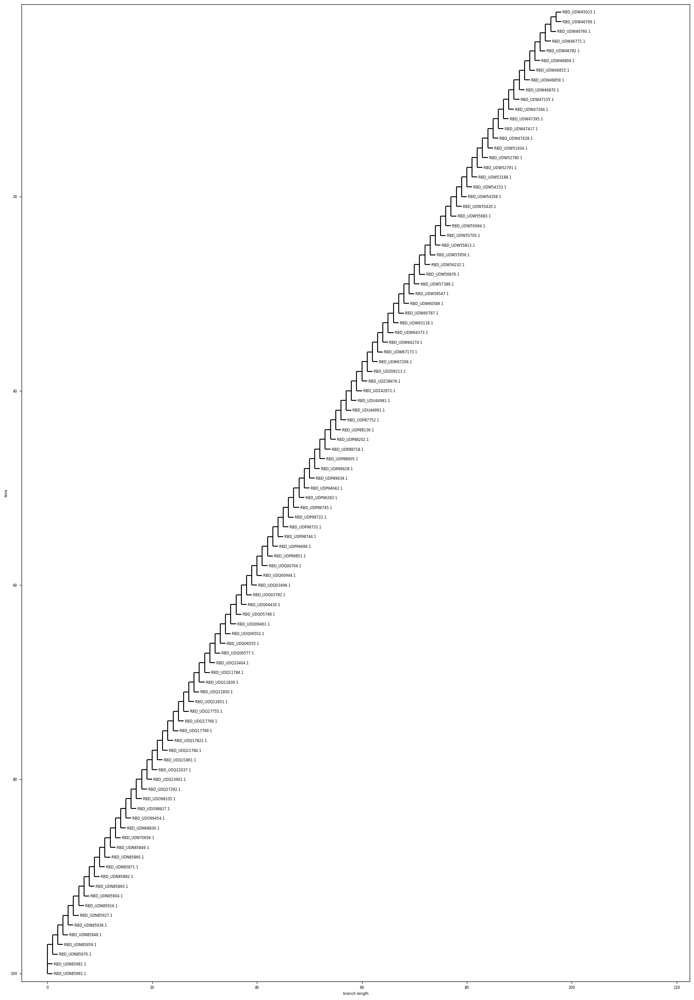

None
Alignment of 05AK:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51389.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51476.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56613.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59669.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64539.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY95944.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY95987.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00139.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00150.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00161.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00529.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00540.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00882.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00893.1
RVQPTESIVRF

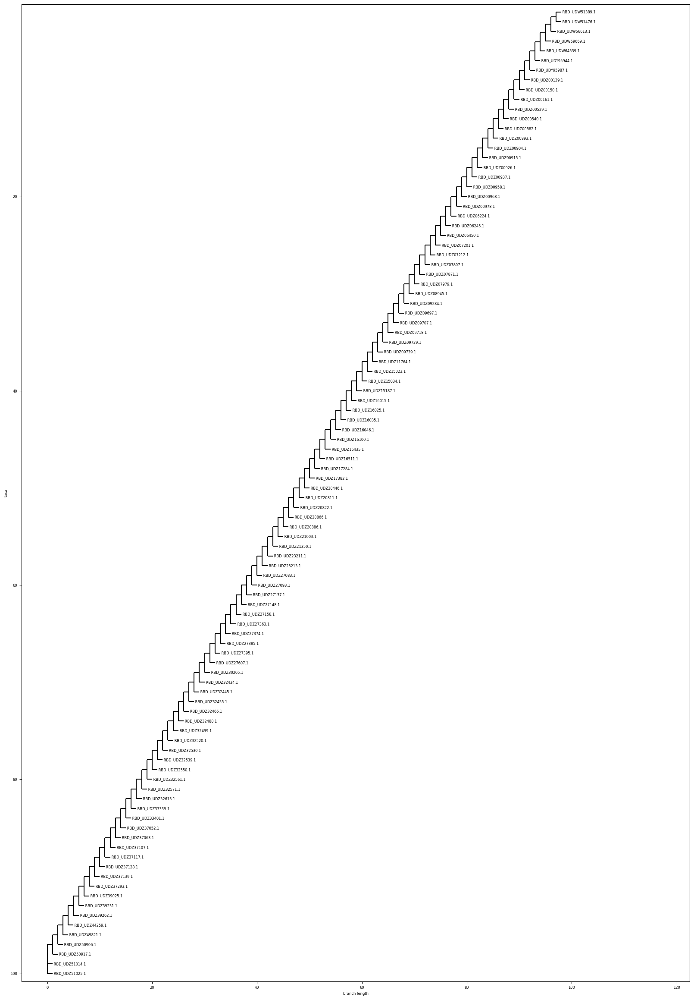

None
Alignment of 05AZ:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45166.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45265.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49868.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50655.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50743.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51073.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51247.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53243.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53716.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54729.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54740.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW55135.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW55146.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW55157.1
RVQPTESIVRF

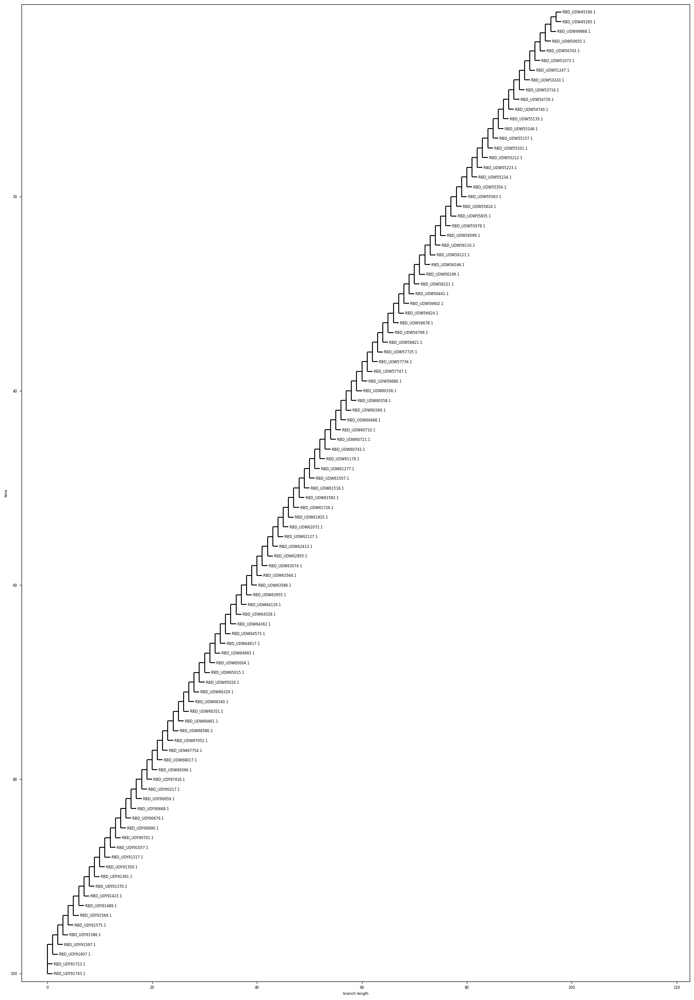

None
Alignment of 05AR:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58703.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59011.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW62051.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64749.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW65904.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY87128.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY87643.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY88566.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY88932.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY97958.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY98013.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY98931.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ04901.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ05135.1
RVQPTESIVRF

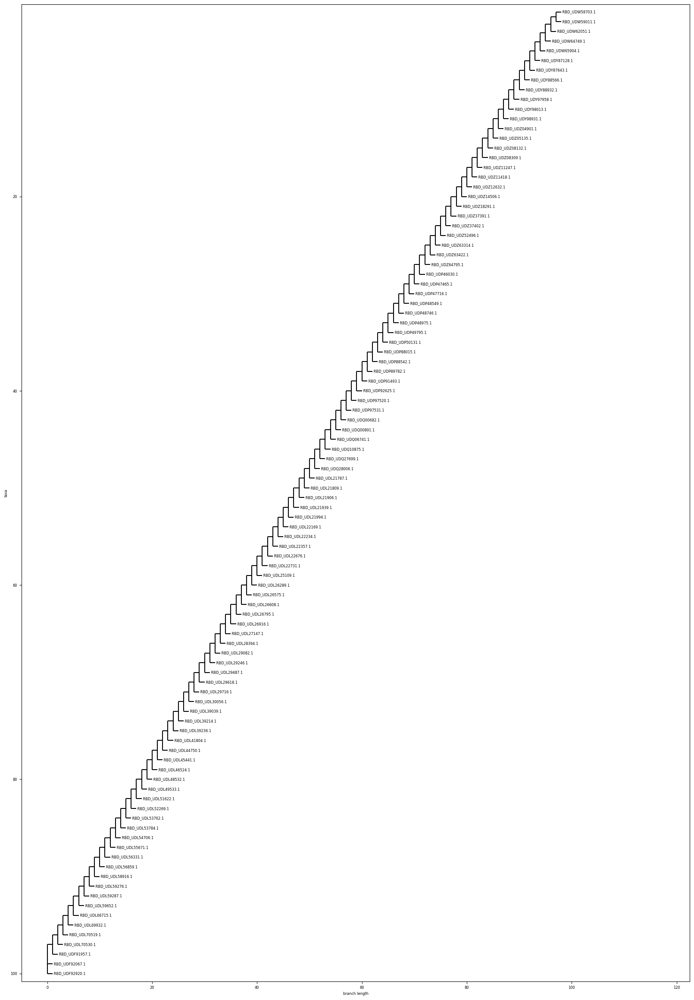

None
Alignment of 05CA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39080.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39092.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39103.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39113.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39123.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39134.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39145.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39156.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39533.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39543.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39554.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39565.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39575.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39586.1
RVQPTESIVRF

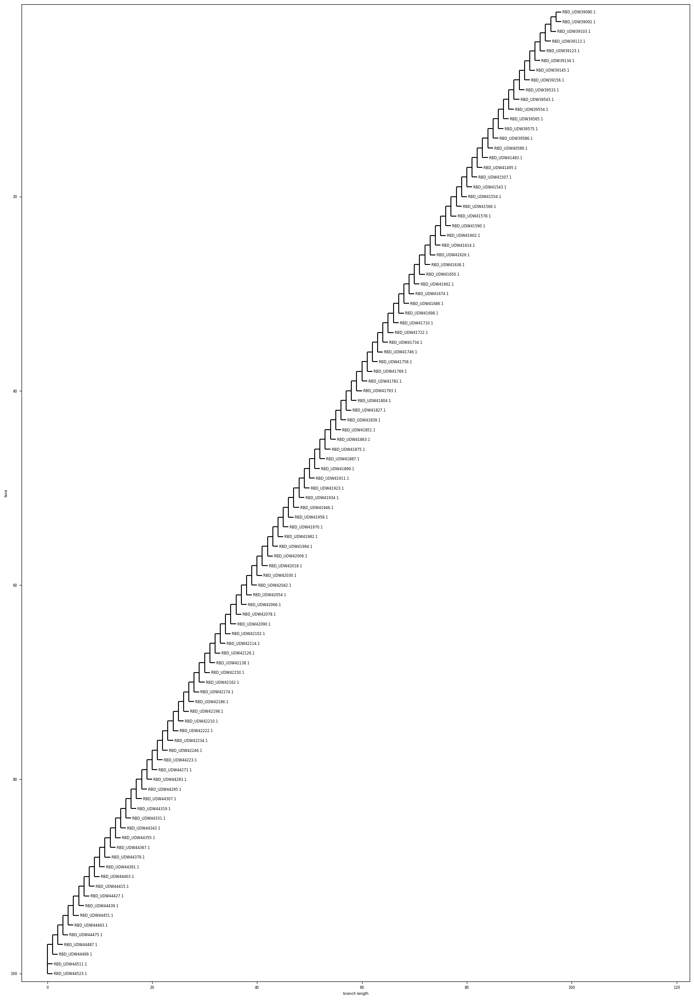

None
Alignment of 05CO:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38971.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39025.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39244.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39255.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39266.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40435.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40470.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40506.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40577.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40601.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40613.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40624.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40648.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40660.1
RVQPTESIVRF

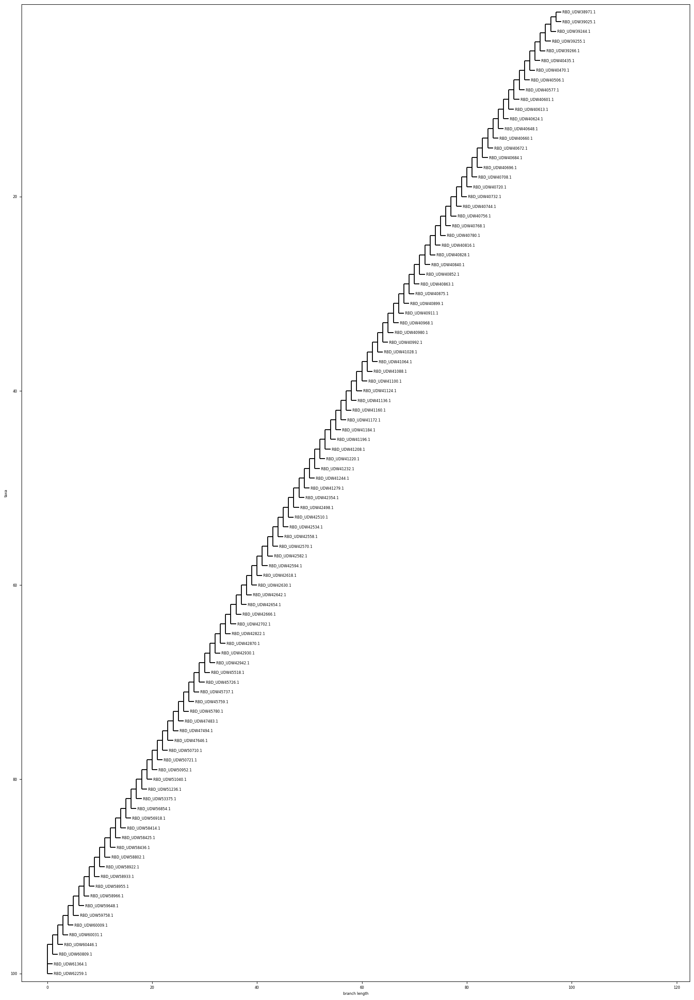

None
Alignment of 05CT:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50489.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50545.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50556.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50633.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54012.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54230.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54262.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59944.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60842.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW62711.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY75388.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY76224.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09664.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ16393.1
RVQPTESIVRF

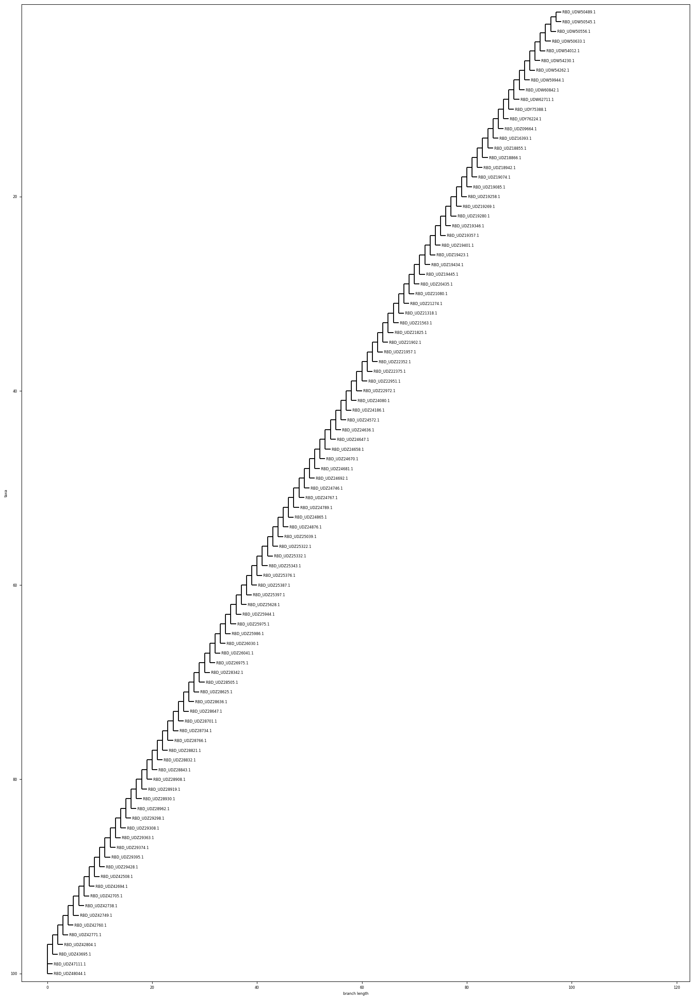

None
Alignment of 05DE:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58492.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59056.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68136.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ19680.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ19962.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ20467.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ20477.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ20488.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ21263.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ21573.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ21891.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ22330.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ22590.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ22611.1
RVQPTESIVRF

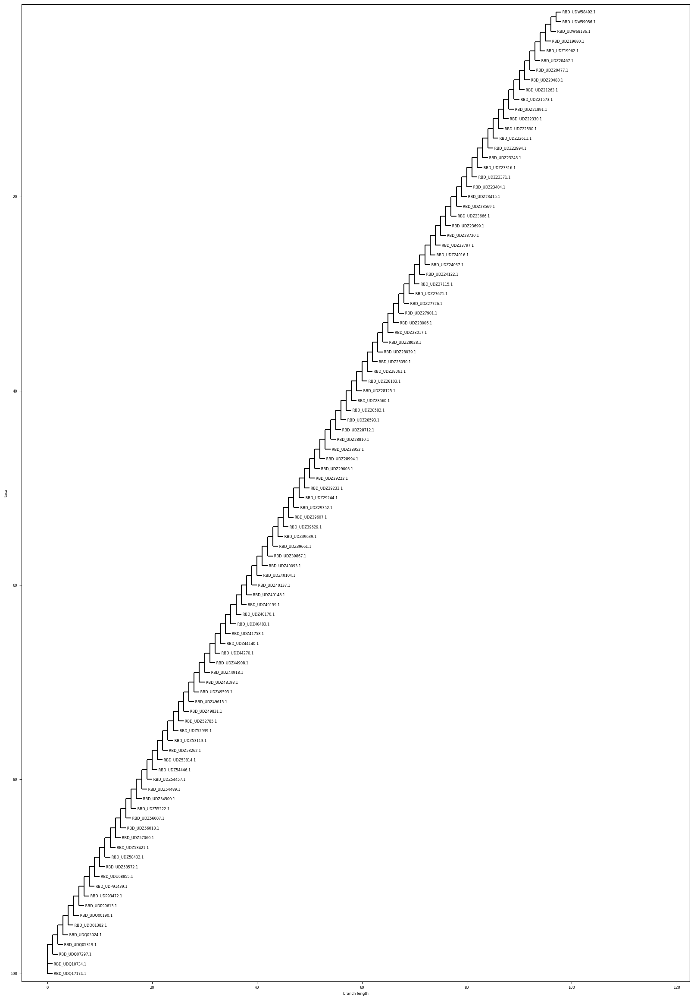

None
Alignment of 05FL:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38982.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38993.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39036.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39047.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39058.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39167.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39178.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39189.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39200.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39211.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39222.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39233.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39277.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39288.1
RVQPTESIVRF

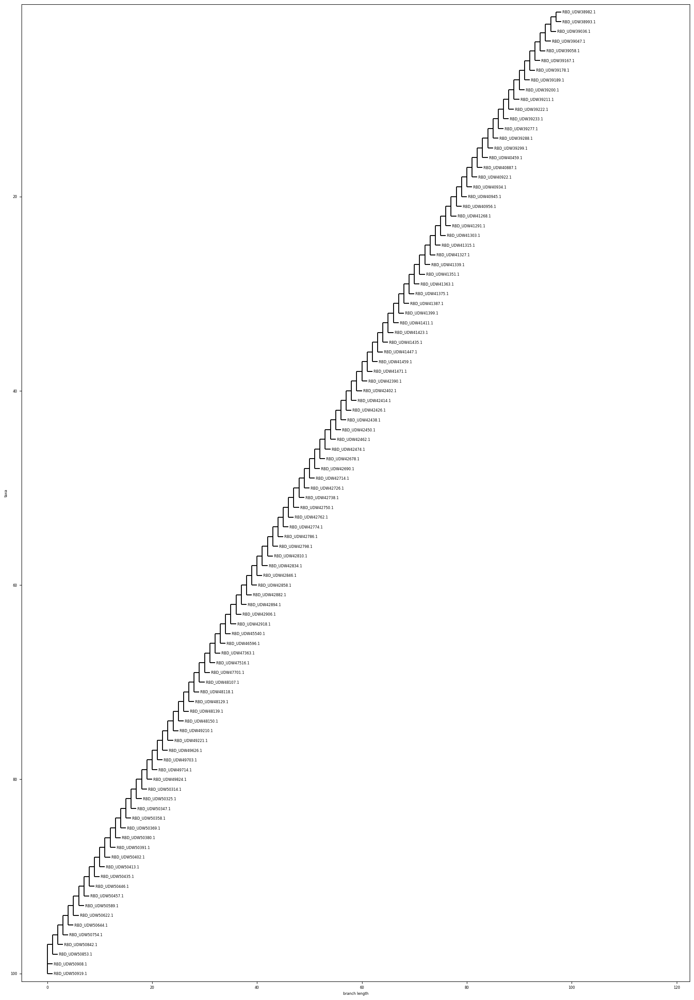

None
Alignment of 05GA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40518.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40804.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41040.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45045.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45364.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45375.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45507.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47101.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47176.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47472.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47657.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48041.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48074.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48740.1
RVQPTESIVRF

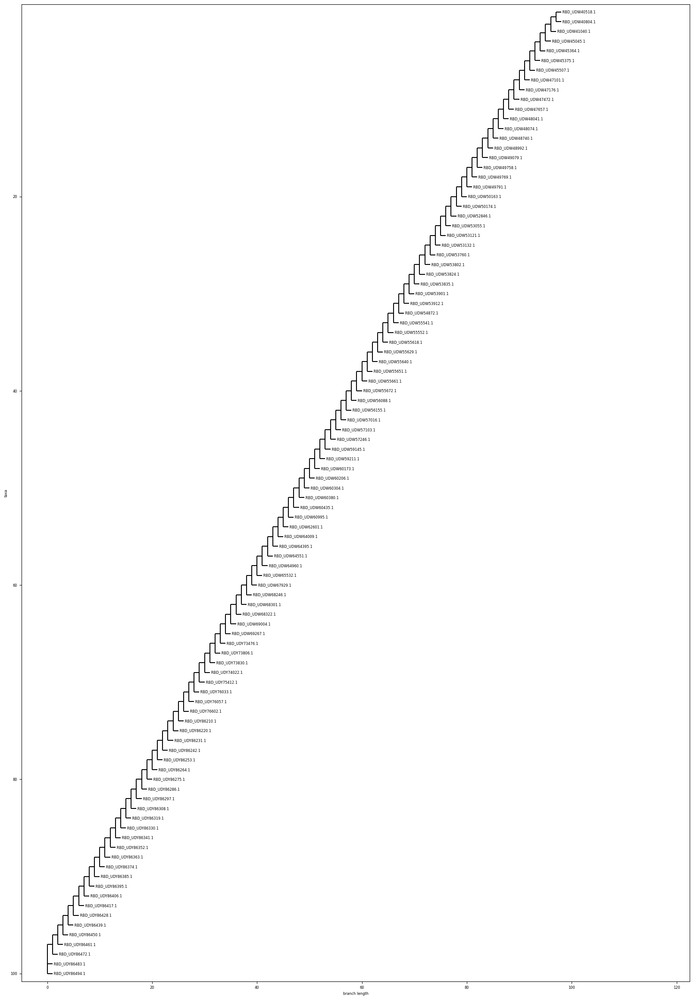

None
Alignment of 05HI:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW66472.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY88781.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ01258.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ07083.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09888.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ45006.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ68782.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ68996.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU67696.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ40411.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ40608.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ40729.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ40751.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ41520.1
RVQPTESIVRF

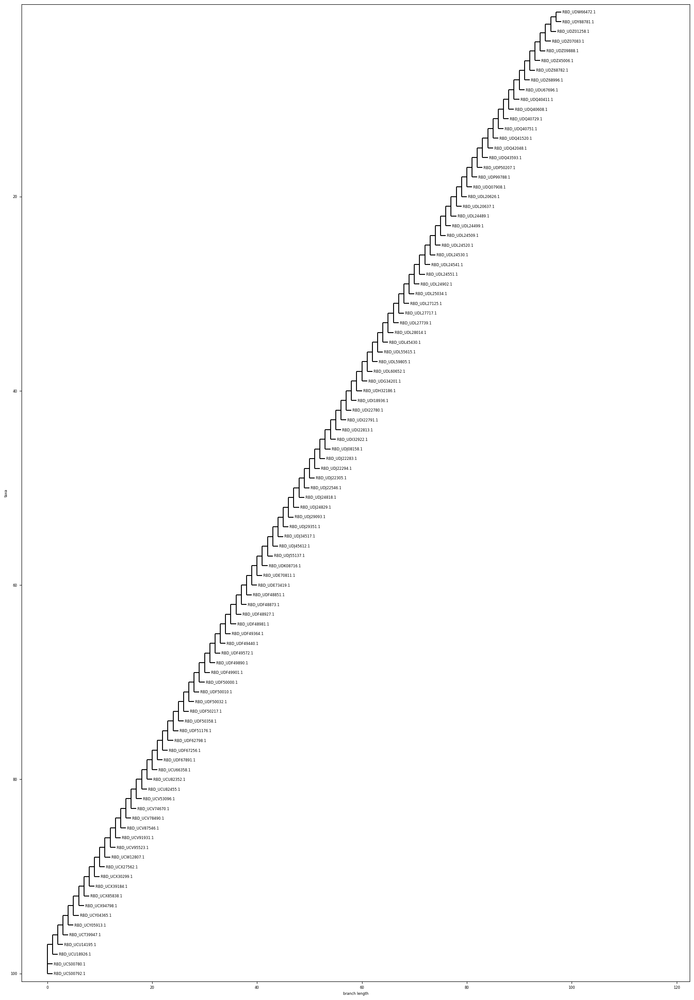

None
Alignment of 05ID:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45824.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46478.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46629.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49014.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49024.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49528.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49956.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49967.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49978.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49989.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50000.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52407.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52517.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52528.1
RVQPTESIVRF

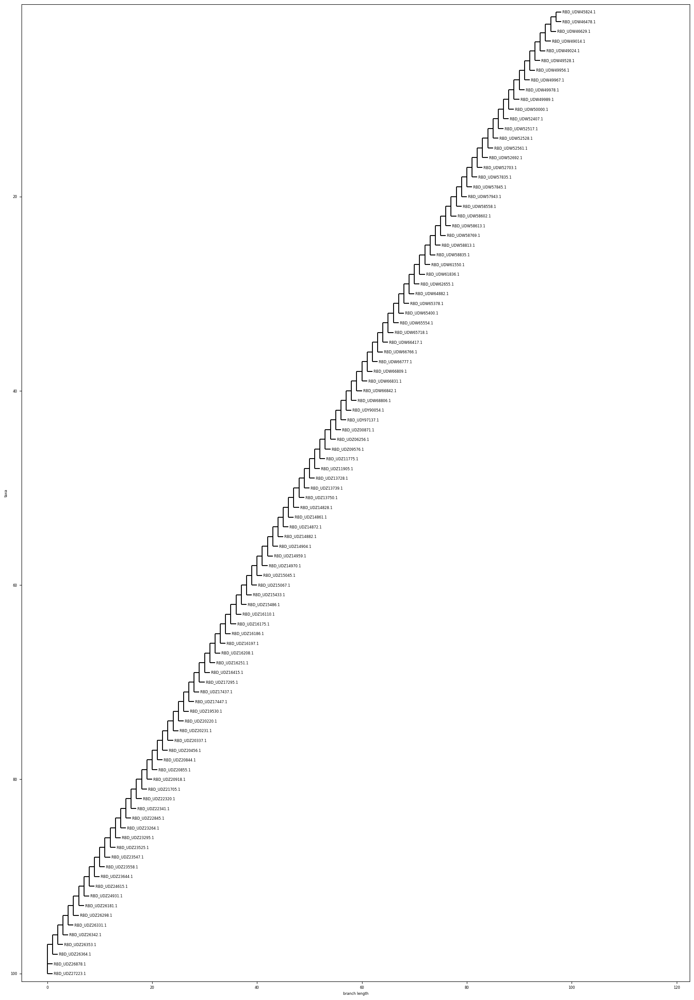

None
Alignment of 05IL:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41519.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW43565.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45001.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45221.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45419.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46084.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46193.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46259.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46291.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47855.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48454.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48849.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49167.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49879.1
RVQPTESIVRF

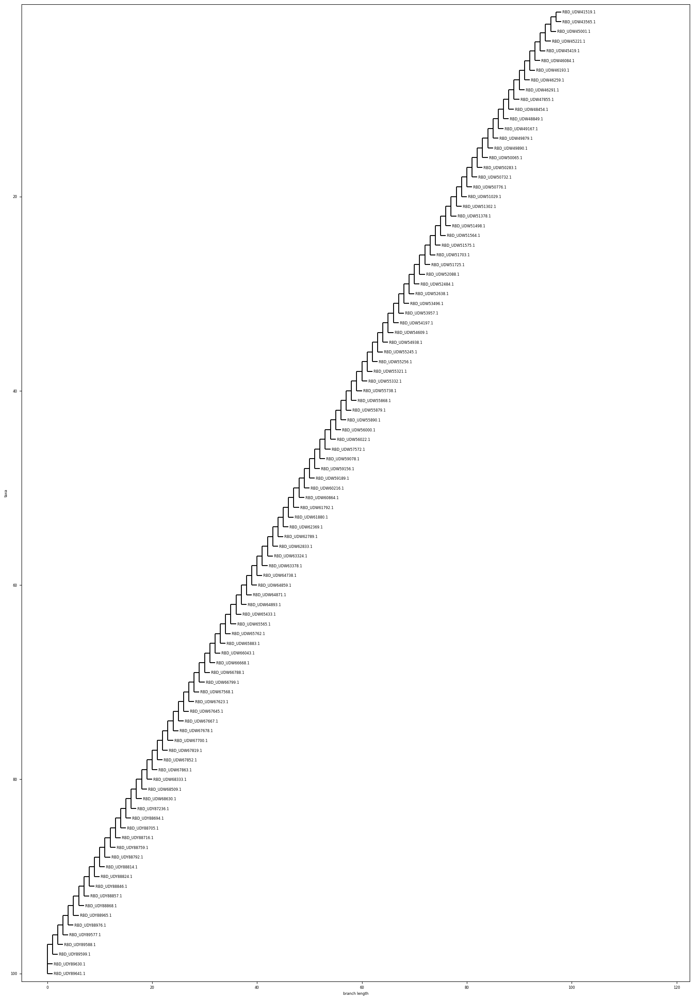

None
Alignment of 05IN:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45353.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45628.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45660.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45671.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45769.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45867.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46423.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46673.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46695.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47450.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47537.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47548.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47559.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47569.1
RVQPTESIVRF

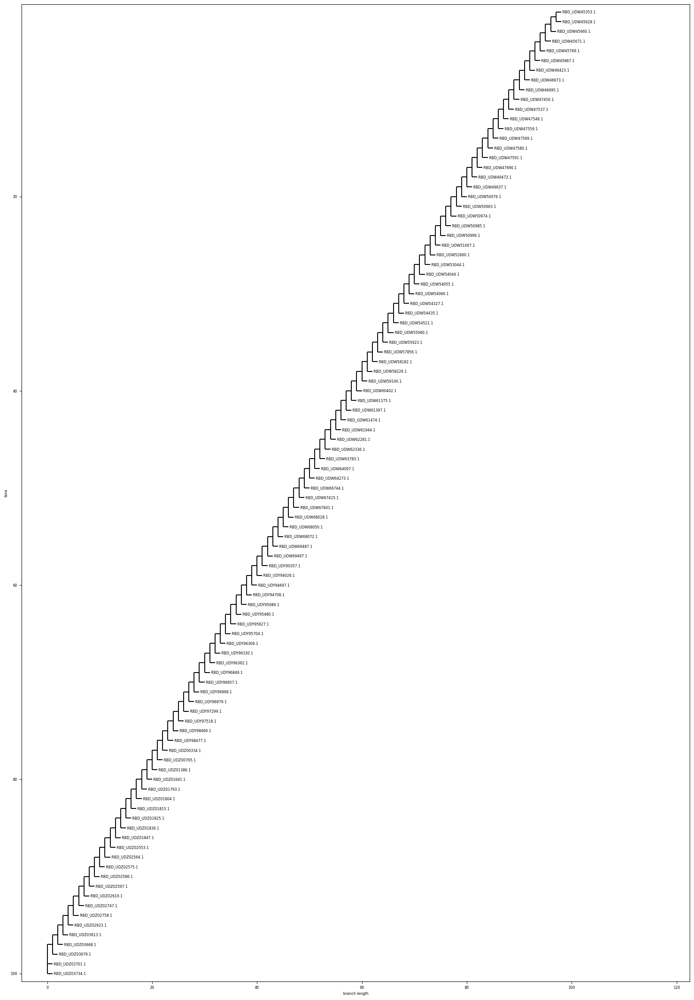

None
Alignment of 05IA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW44979.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45144.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45155.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45254.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46499.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48641.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48663.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48674.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48685.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48696.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48970.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49057.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50424.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51857.1
RVQPTESIVRF

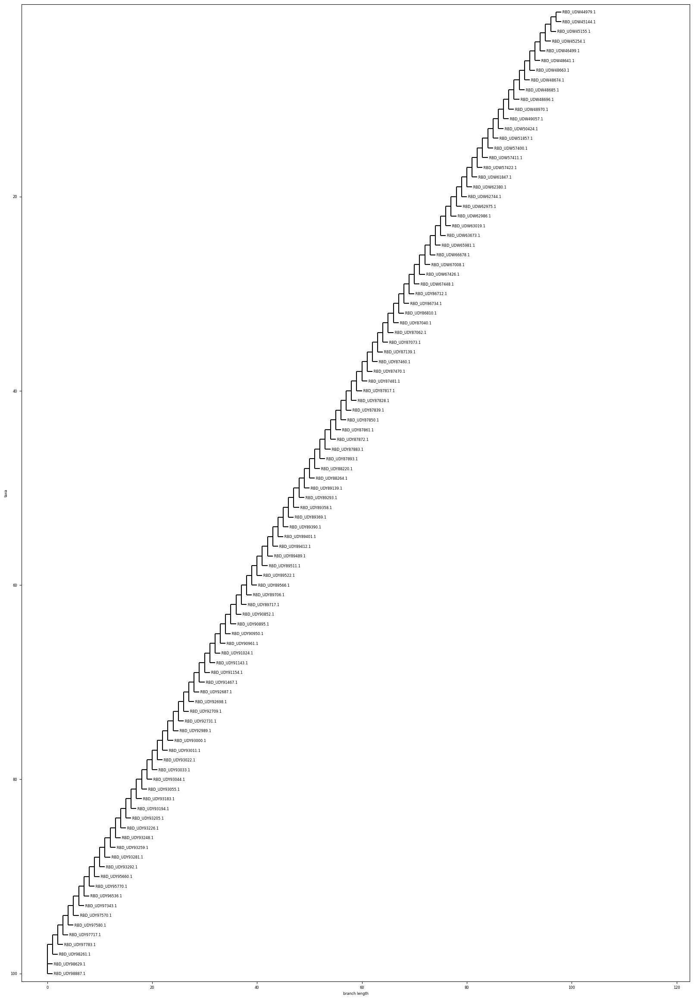

None
Alignment of 05KS:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48315.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49188.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49199.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52154.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52165.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52473.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59366.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61320.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW62767.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64152.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW65521.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW66120.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68487.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY86876.1
RVQPTESIVRF

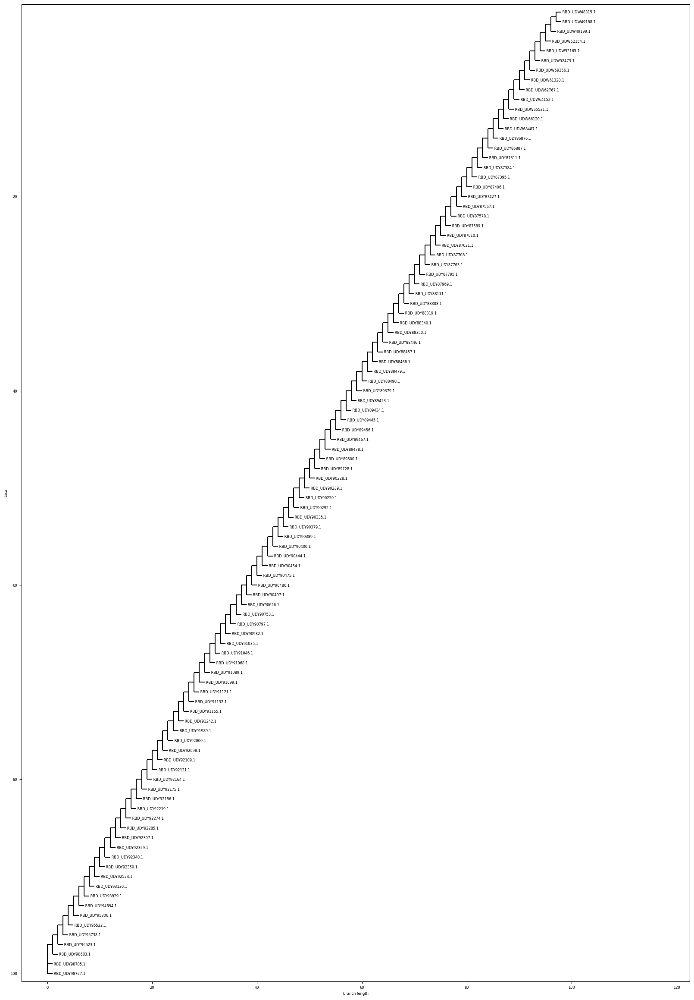

None
Alignment of 05KY:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46793.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47439.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51769.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51802.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53177.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53890.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54620.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54631.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54642.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54653.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54718.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54806.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW55376.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW55716.1
RVQPTESIVRF

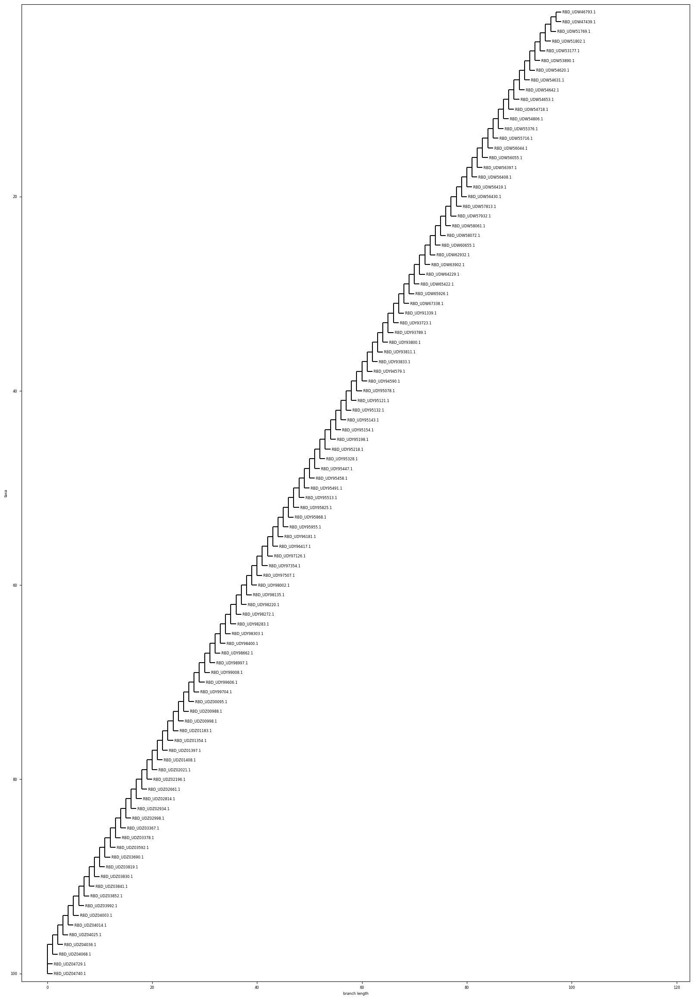

None
Alignment of 05LA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45835.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47090.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51509.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51597.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51923.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58646.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60490.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67786.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ38325.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ38336.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ40432.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ40652.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ41257.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDQ41564.1
RVQPTESIVRF

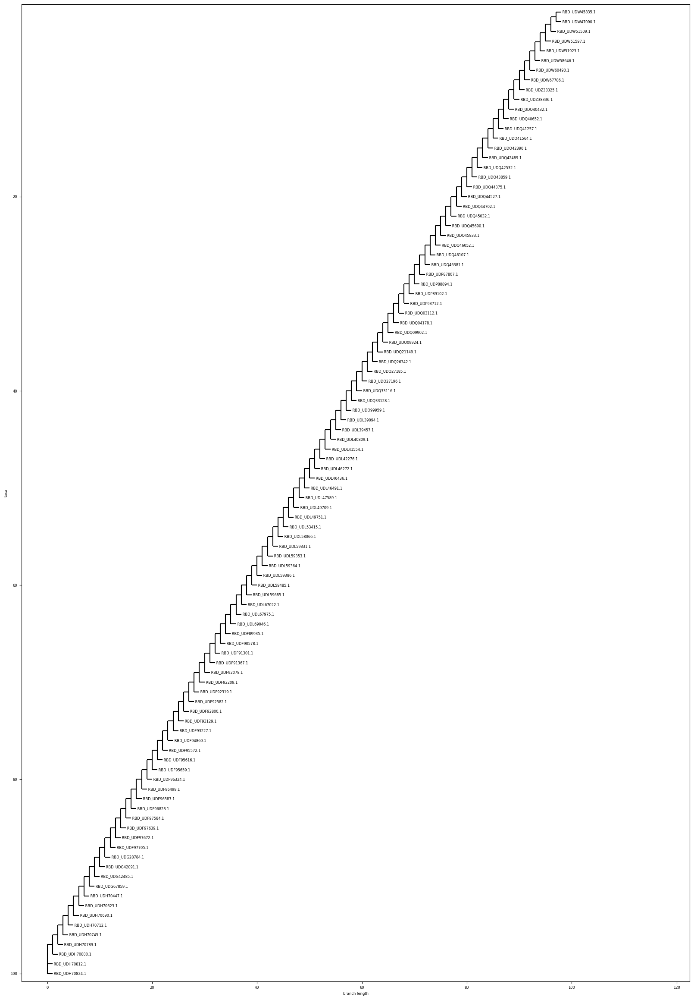

None
Alignment of 05ME:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52912.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56320.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60666.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61660.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61737.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64218.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64240.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67041.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67885.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68192.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68268.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ14817.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ35144.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ43491.1
RVQPTESIVRF

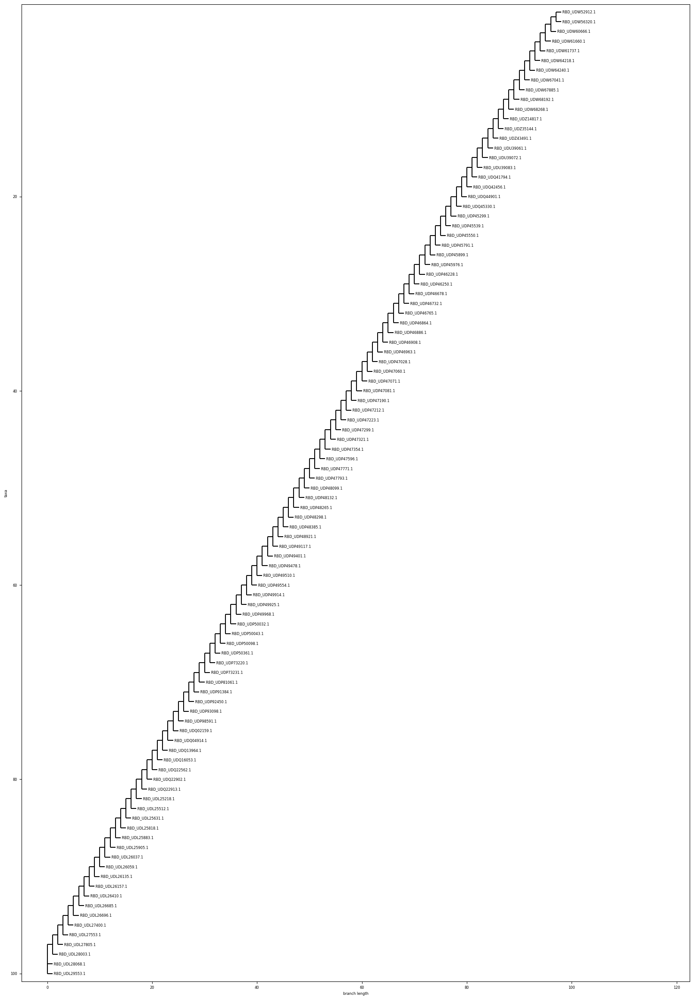

None
Alignment of 05MD:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41531.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46346.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46357.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47297.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49265.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49385.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49517.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49681.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50120.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50699.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51411.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53430.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53474.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53946.1
RVQPTESIVRF

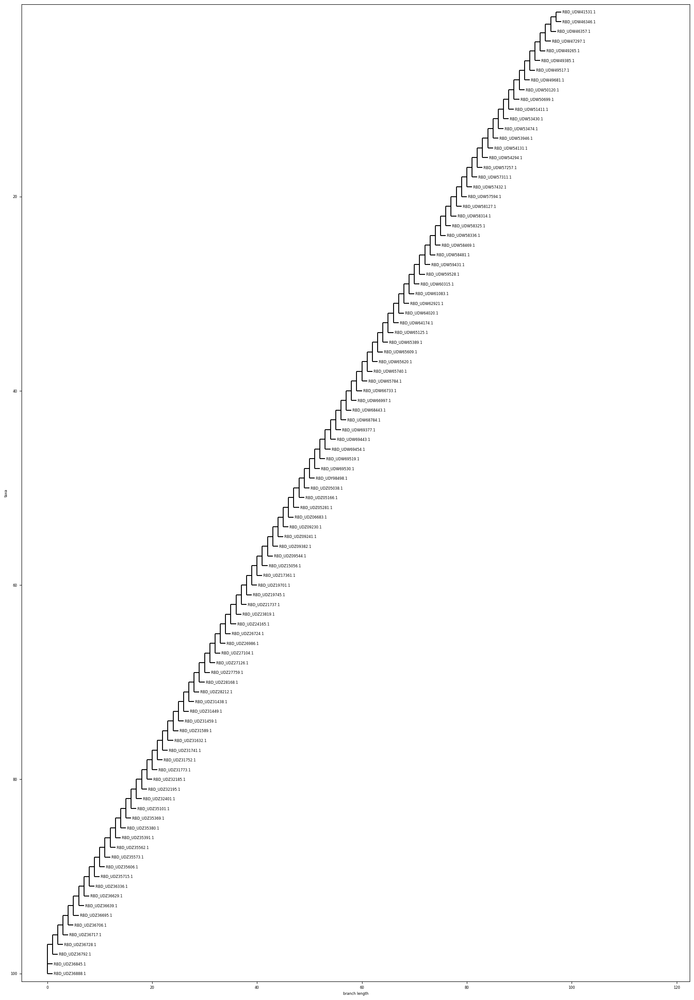

None
Alignment of 05MA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45682.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48432.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48443.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49035.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49363.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49418.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50207.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50305.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50336.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52835.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52868.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52879.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52890.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53210.1
RVQPTESIVRF

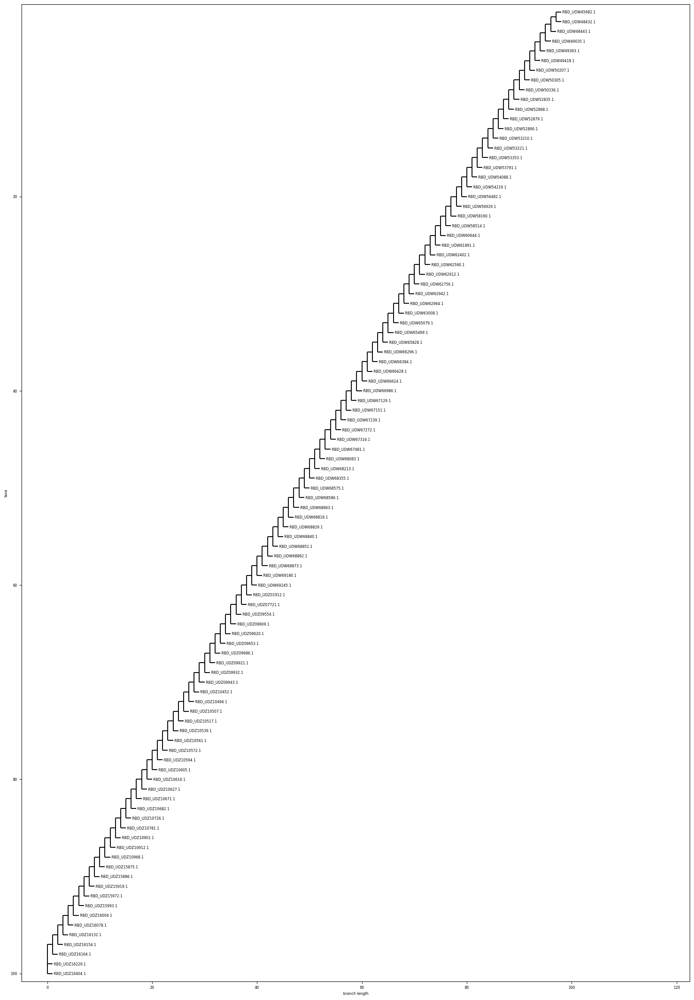

None
Alignment of 05MI:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45342.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45704.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45933.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45944.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46280.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46335.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46390.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46401.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46434.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47133.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47242.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48183.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48260.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48542.1
RVQPTESIVRF

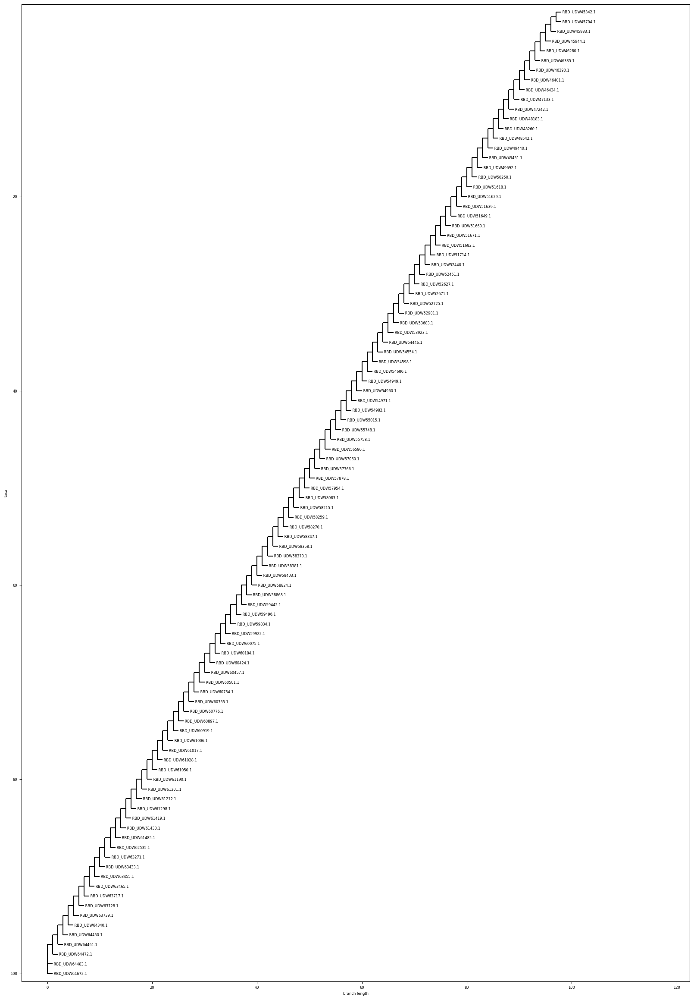

None
Alignment of 05MN:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45056.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45573.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45715.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45846.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45857.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46727.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46749.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46837.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46848.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47057.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47068.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47079.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47286.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47330.1
RVQPTESIVRF

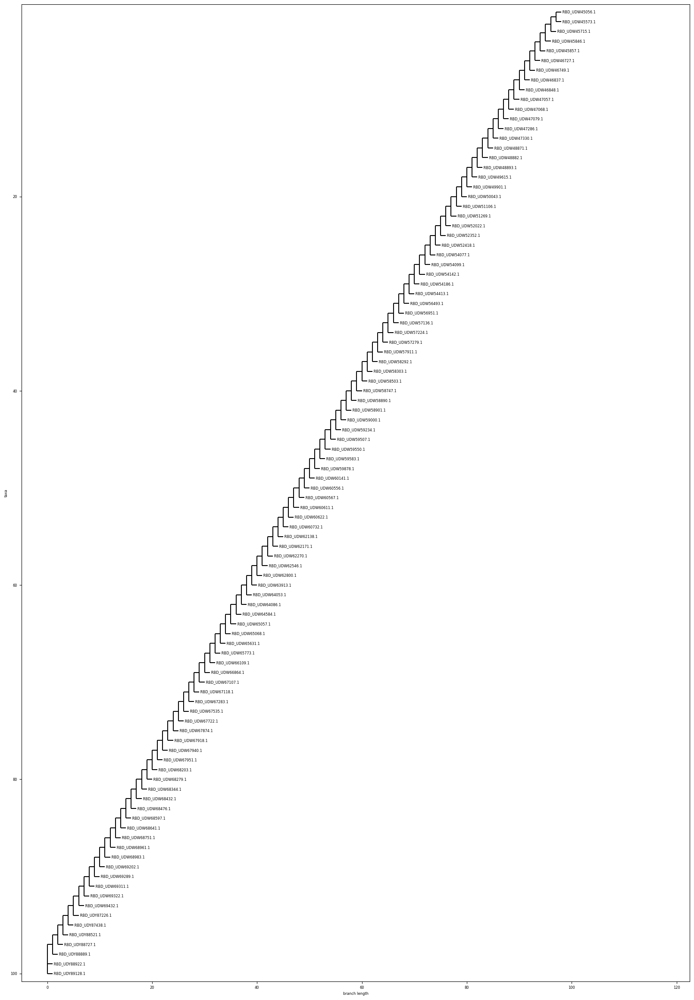

None
Alignment of 05MS:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38231.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38242.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38252.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38263.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38274.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38285.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38296.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38307.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38318.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38329.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38339.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38350.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38361.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38372.1
RVQPTESIVRF

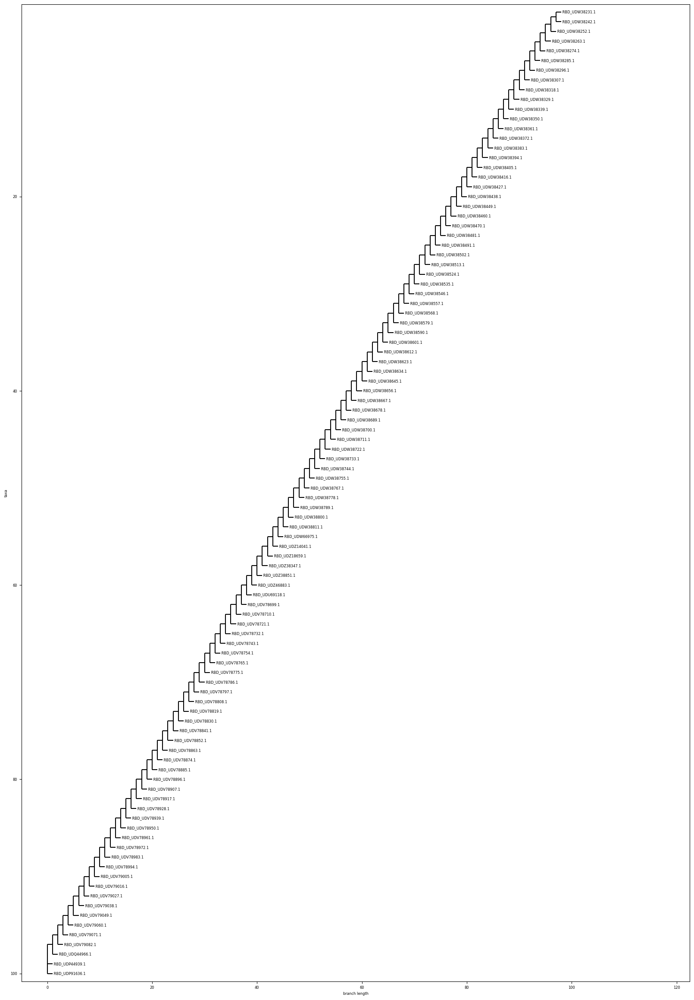

None
Alignment of 05MO:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45034.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46042.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46053.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46074.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46215.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46554.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46826.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47308.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48630.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50523.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52945.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53088.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW55069.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW55299.1
RVQPTESIVRF

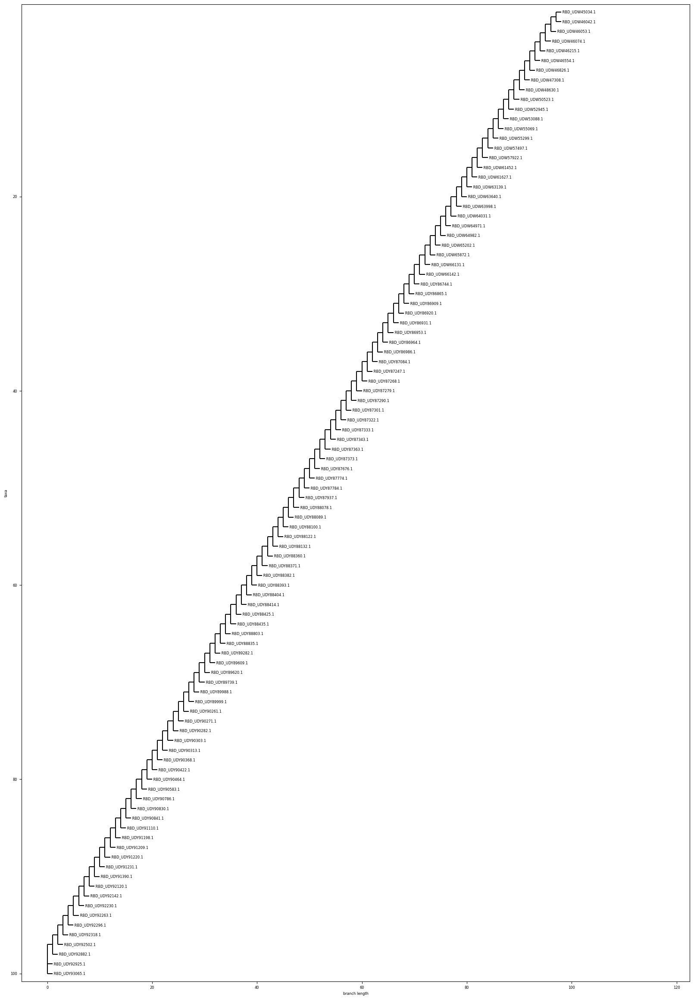

None
Alignment of 05MT:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60108.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60479.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW62303.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW63976.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW66952.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67492.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67524.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67689.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67733.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67797.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY86777.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY86832.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY86843.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY86854.1
RVQPTESIVRF

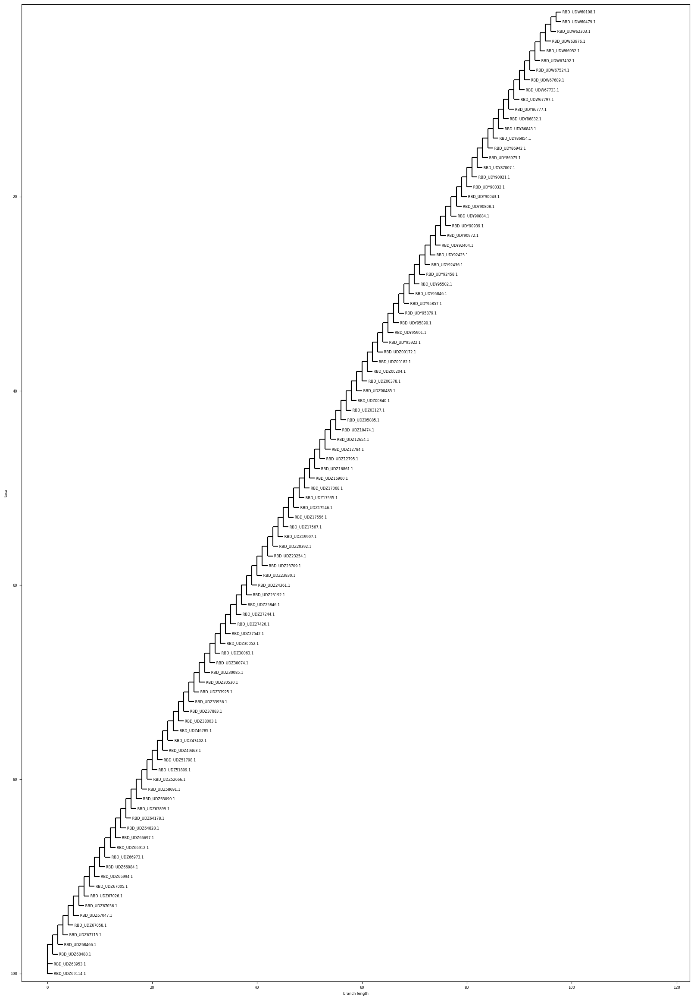

None
Alignment of 05NE:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47187.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48238.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48249.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49101.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49112.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49123.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50228.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53254.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53364.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58138.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58149.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61496.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61977.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW63400.1
RVQPTESIVRF

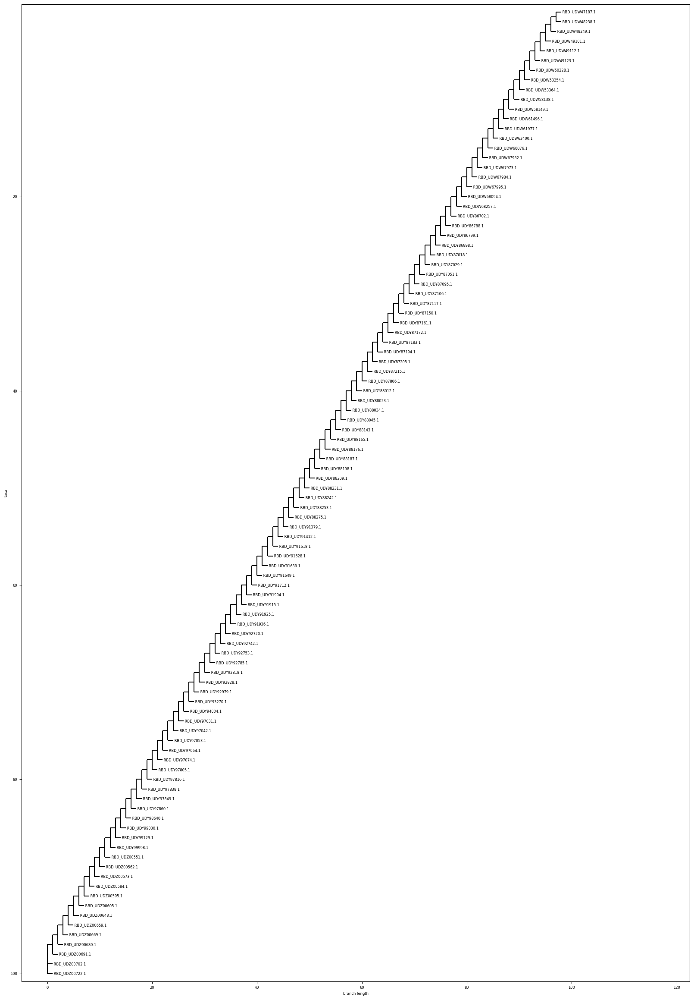

None
Alignment of 05NV:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41815.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48597.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49582.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49593.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50152.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56865.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67743.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68388.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY73021.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY75888.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY88954.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY90637.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY90711.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY90775.1
RVQPTESIVRF

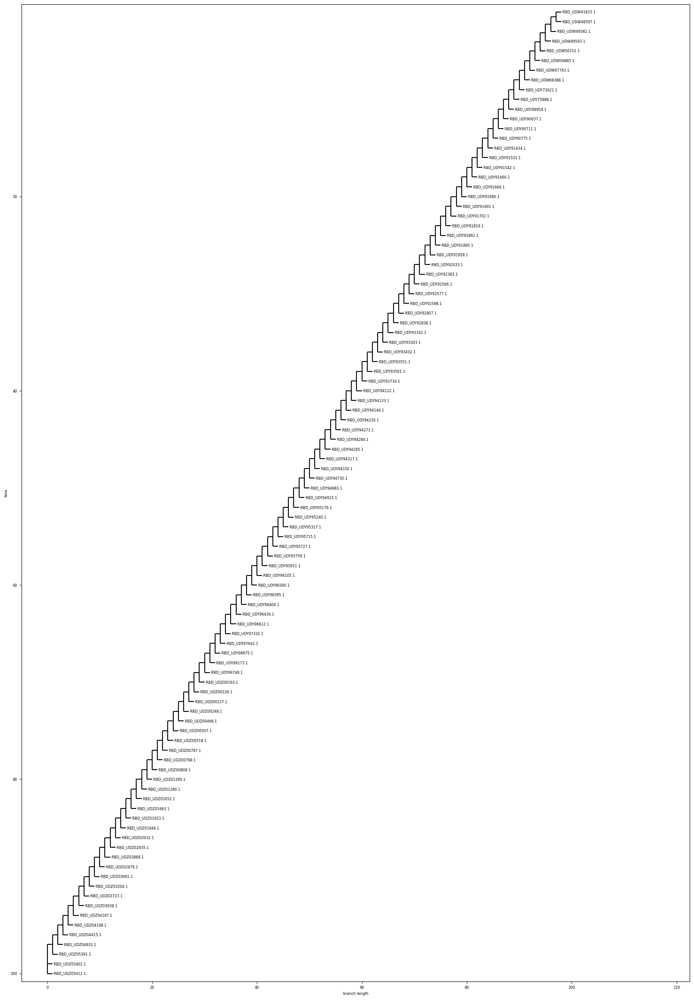

None
Alignment of 05NH:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47866.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47877.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52857.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53199.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60962.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64108.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64163.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64760.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW64771.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW65090.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67907.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW69344.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09749.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09760.1
RVQPTESIVRF

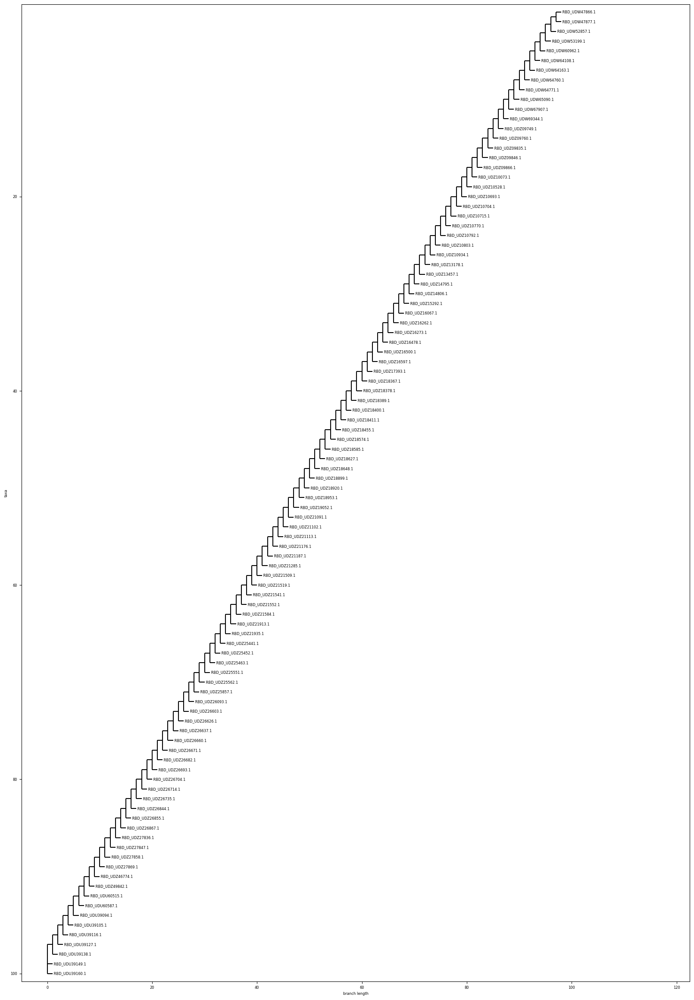

None
Alignment of 05NJ:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45430.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46467.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51051.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51280.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51487.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51978.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53022.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53033.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53276.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53397.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53408.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53419.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53441.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53463.1
RVQPTESIVRF

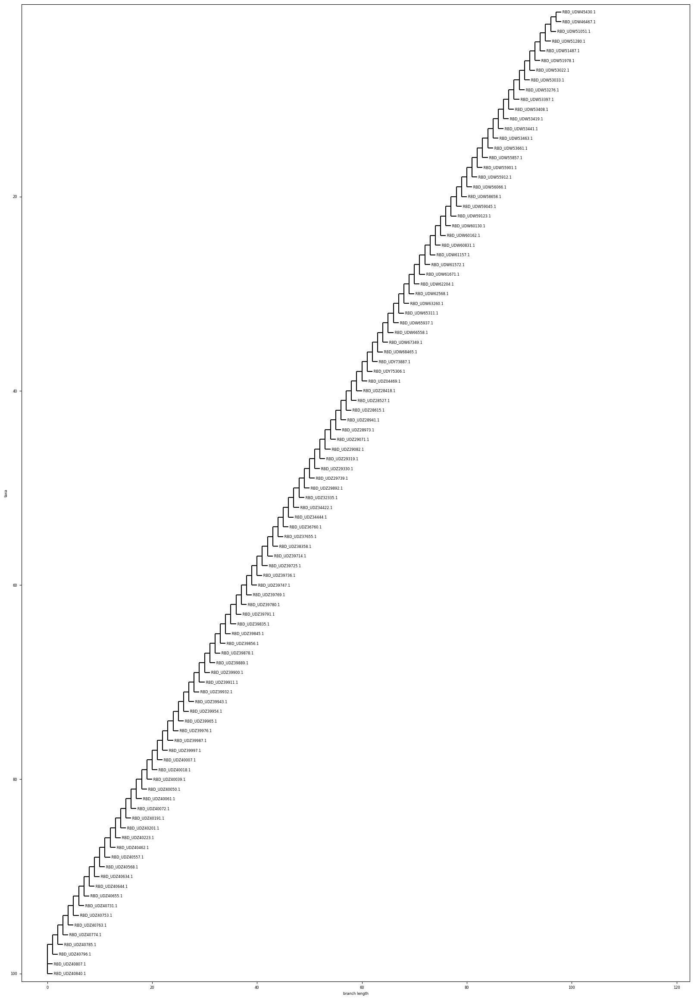

None
Alignment of 05NM:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49330.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57758.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57769.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57986.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57996.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58007.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58525.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58725.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW65707.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67195.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67250.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67261.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67896.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68114.1
RVQPTESIVRF

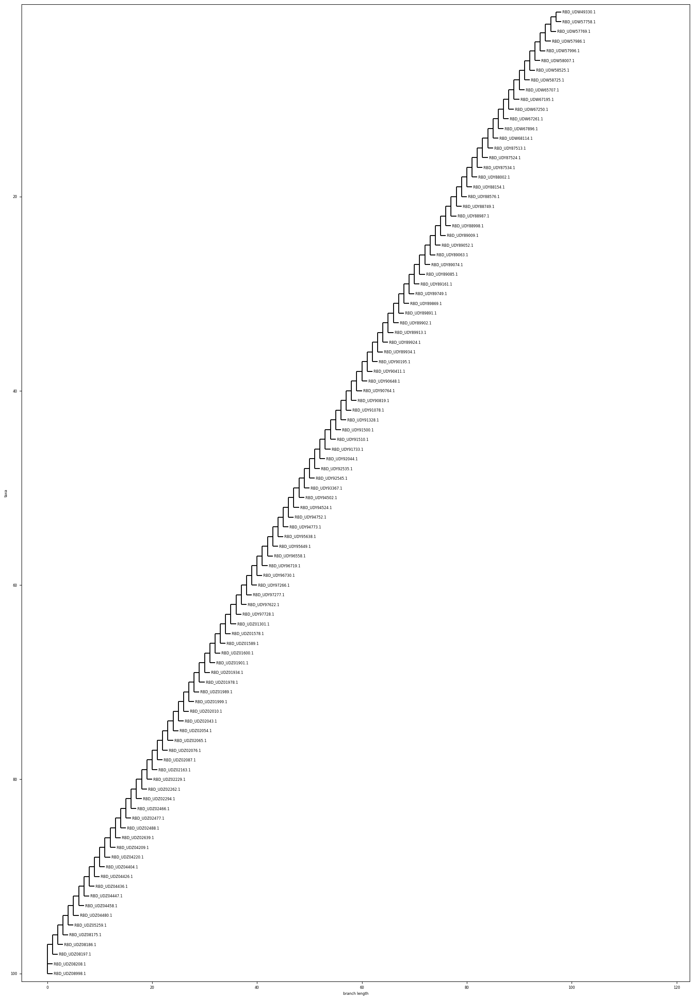

None
Alignment of 05NY:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45802.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45813.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46248.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46565.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48498.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48729.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48959.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49802.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50787.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51291.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51520.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51531.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51553.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52583.1
RVQPTESIVRF

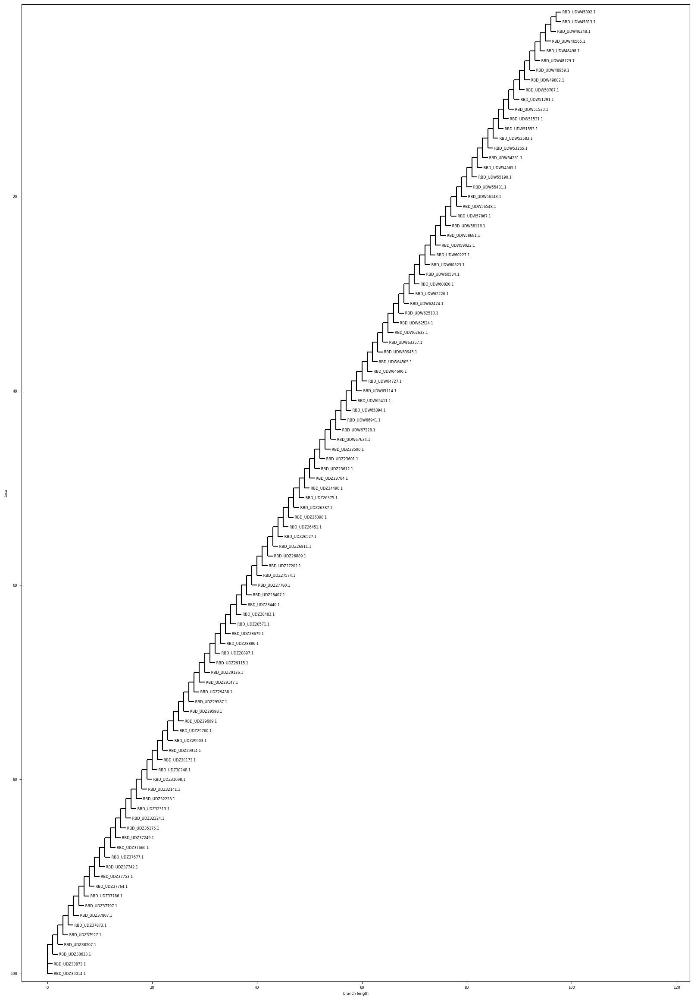

None
Alignment of 05NC:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45078.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46031.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47112.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47123.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47144.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47253.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47756.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47767.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47844.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48282.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48465.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48476.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48487.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48773.1
RVQPTESIVRF

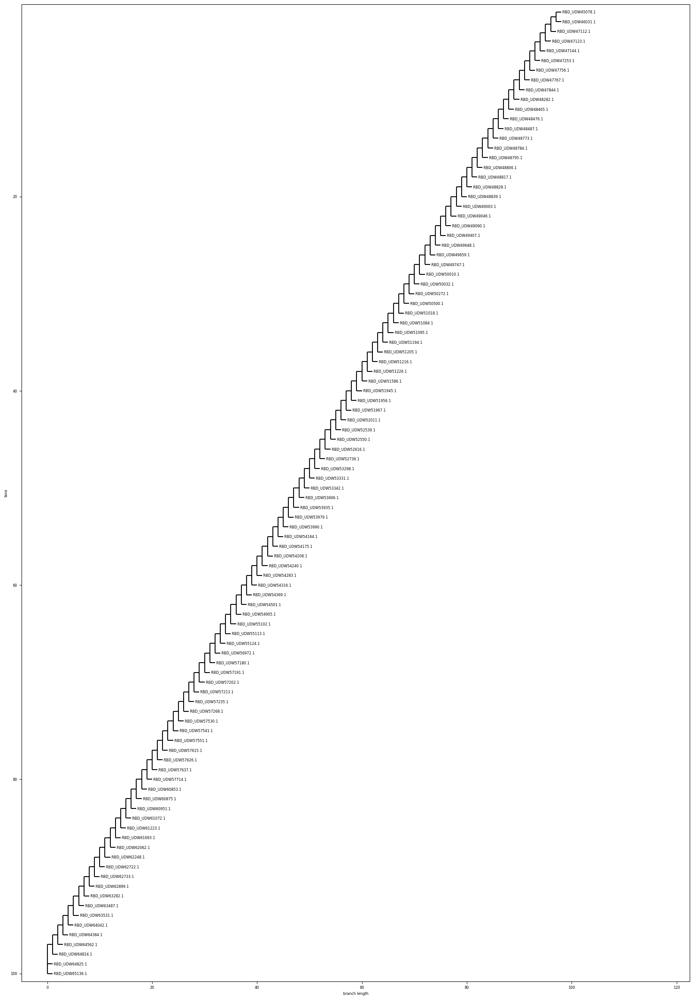

None
Alignment of 05ND:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDP95268.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDP12601.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDP14090.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDP16399.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDN13051.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDN16481.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDN17523.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDL41522.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDG70239.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDH40451.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDH40583.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDH46606.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDH47844.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDH82406.1
RVQPTESIVRF

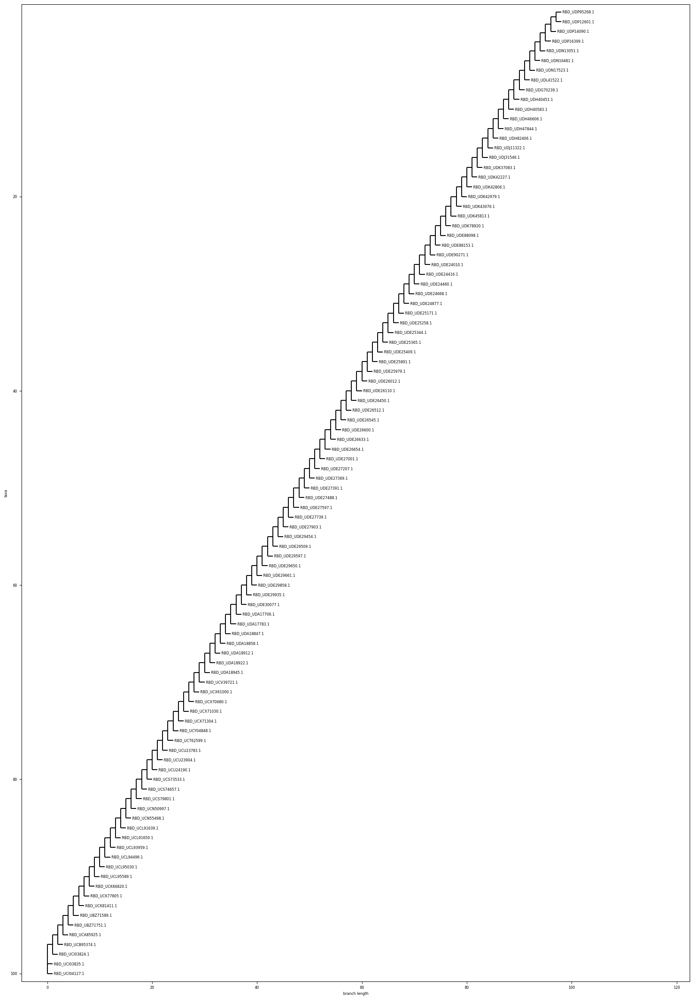

None
Alignment of 05OH:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40447.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45287.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45298.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45309.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45452.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45463.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45474.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45485.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45496.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45639.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45889.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46105.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46116.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46127.1
RVQPTESIVRF

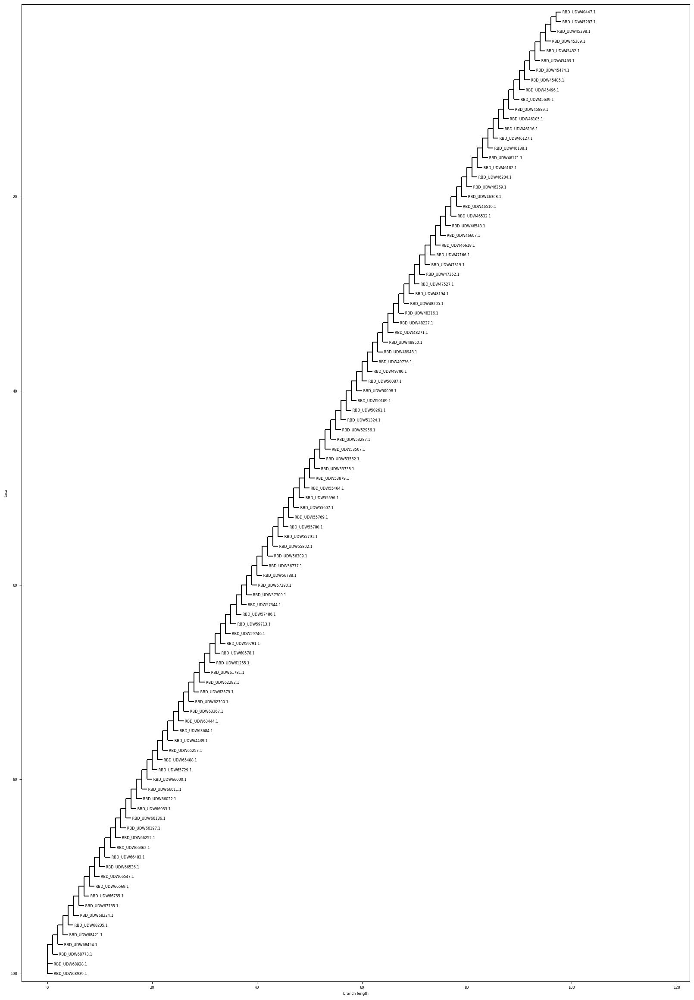

None
Alignment of 05OK:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45177.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48586.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49495.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50185.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50196.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54033.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54110.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54576.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54587.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56504.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59561.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59605.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59724.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60929.1
RVQPTESIVRF

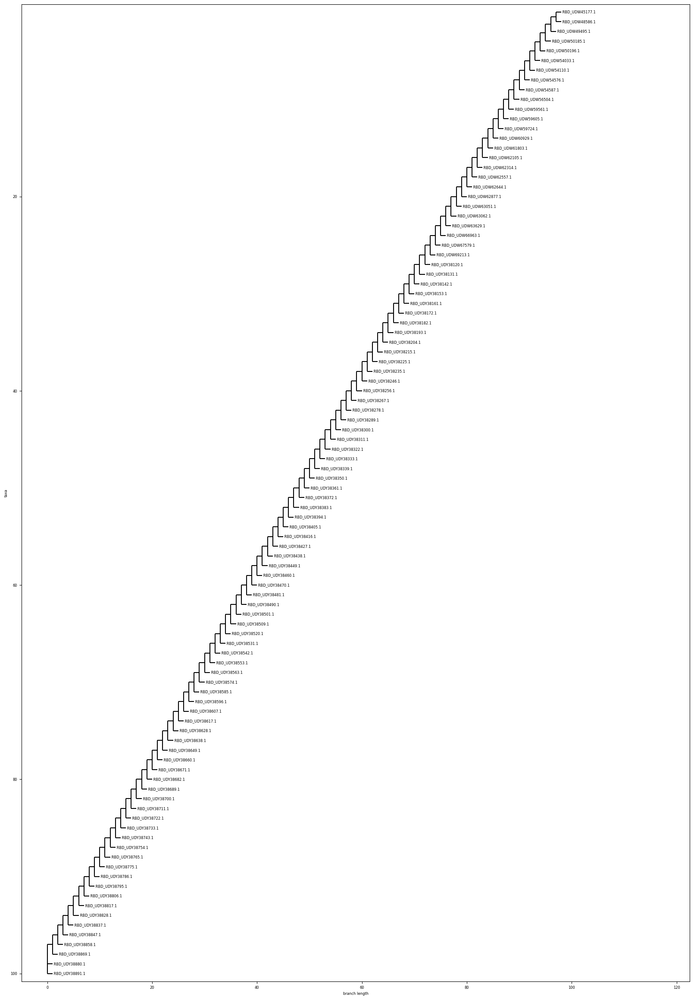

None
Alignment of 05OR:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48293.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48400.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50468.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50478.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50666.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51542.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52506.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56342.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58624.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58791.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58977.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59311.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59889.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60097.1
RVQPTESIVRF

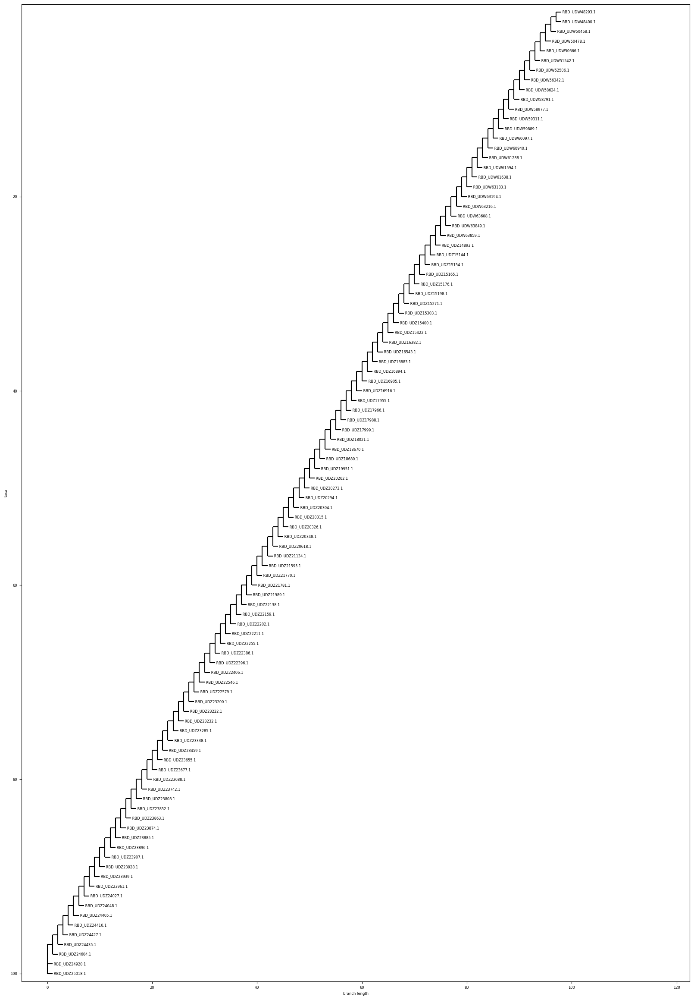

None
Alignment of 05PA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39069.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45111.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45397.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46684.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47712.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47723.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47745.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48707.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48718.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48981.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49134.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50534.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53628.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54272.1
RVQPTESIVRF

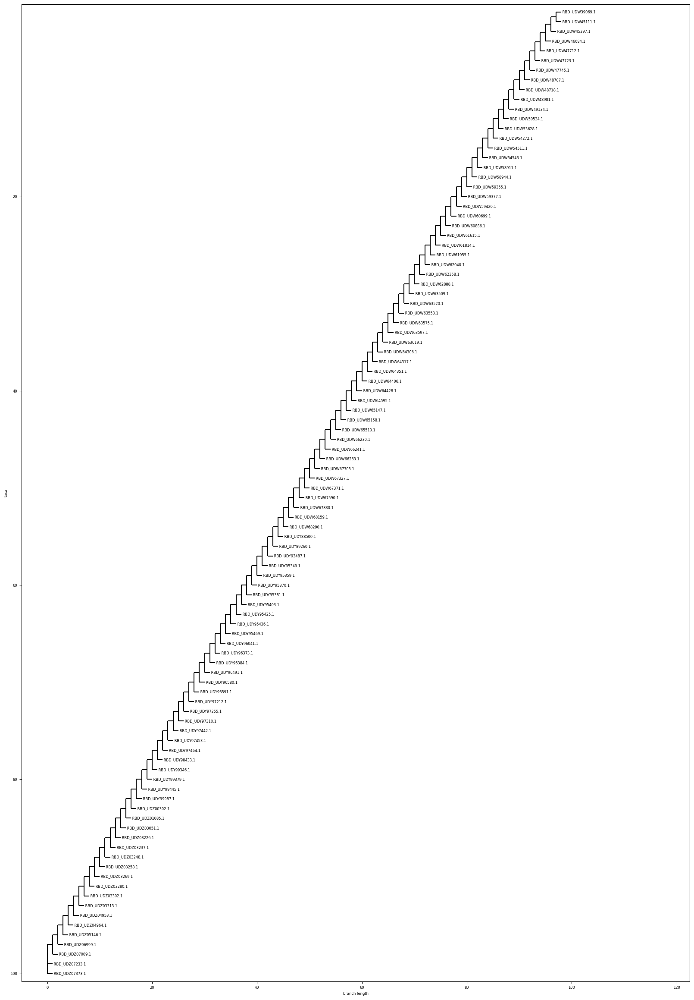

None
Alignment of 05RI:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46488.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48608.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48619.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56386.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61966.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW65289.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW67711.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09565.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09587.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09598.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09631.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09965.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ10485.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ10550.1
RVQPTESIVRF

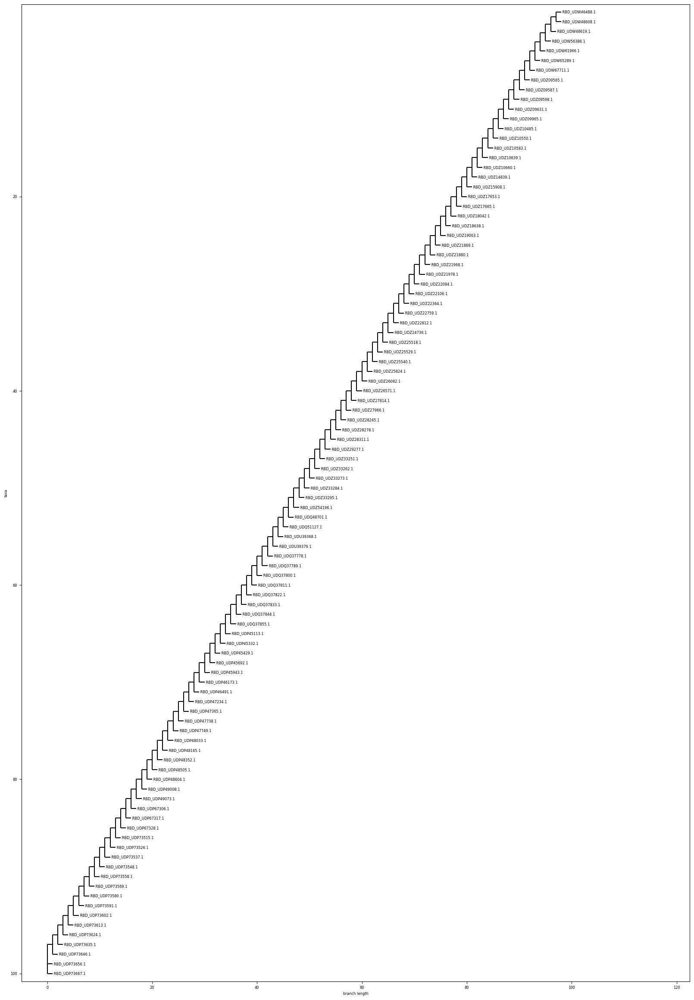

None
Alignment of 05SC:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47778.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47789.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47800.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47811.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50765.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51139.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51150.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51172.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53309.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53386.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57027.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57648.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58447.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60020.1
RVQPTESIVRF

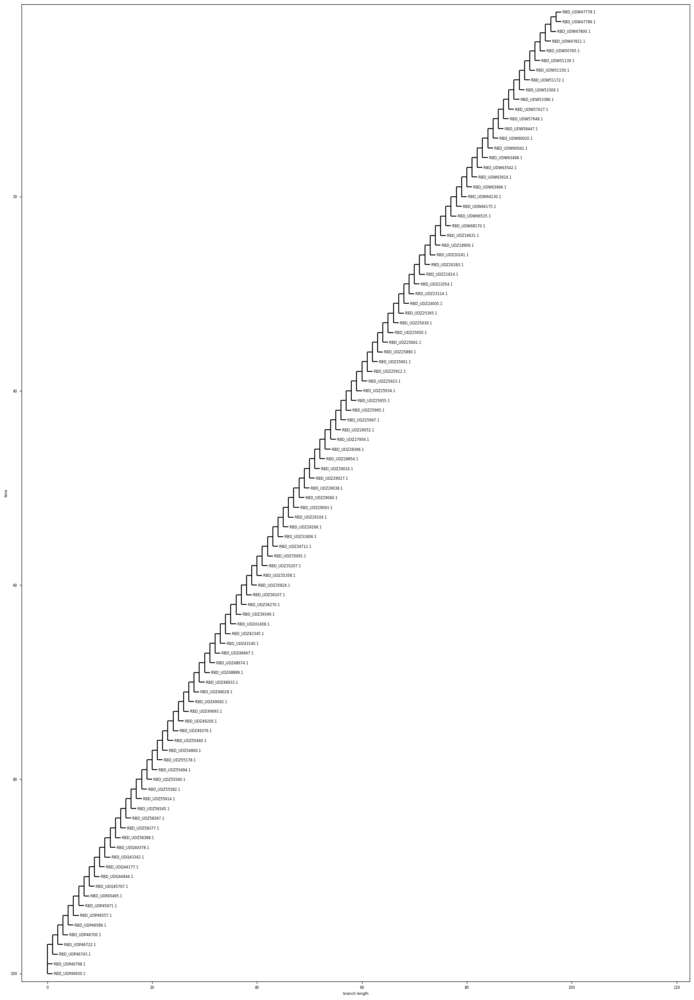

None
Alignment of 05SD:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56331.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56962.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56983.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61138.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW63987.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68531.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY88738.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY93237.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY98673.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00117.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00420.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00431.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ33498.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU69195.1
RVQPTESIVRF

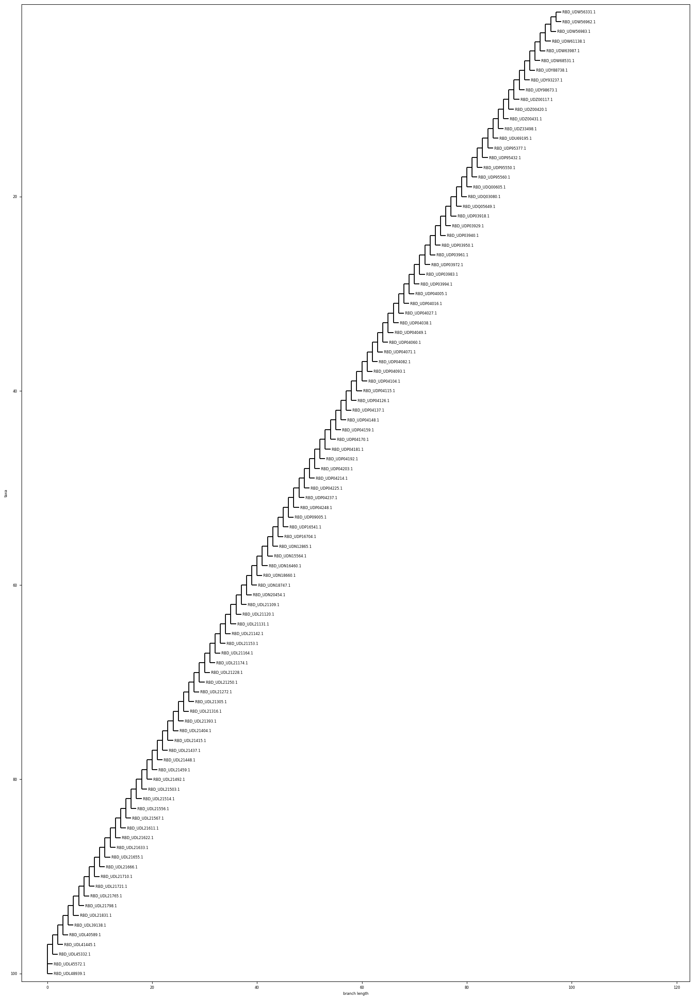

None
Alignment of 05TN:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW44247.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45089.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45922.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46094.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46456.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46521.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46576.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46586.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46640.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46651.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46881.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46892.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46903.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46914.1
RVQPTESIVRF

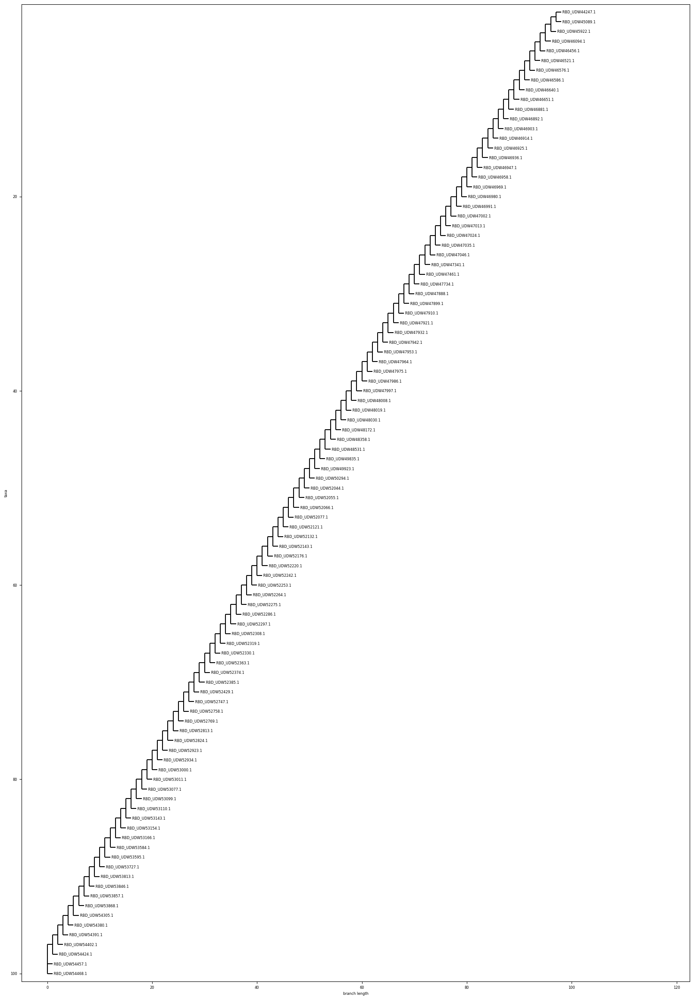

None
Alignment of 05TX:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38884.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38894.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38905.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38916.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38927.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38938.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38949.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38960.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39004.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39015.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39310.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39320.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39330.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39340.1
RVQPTESIVRF

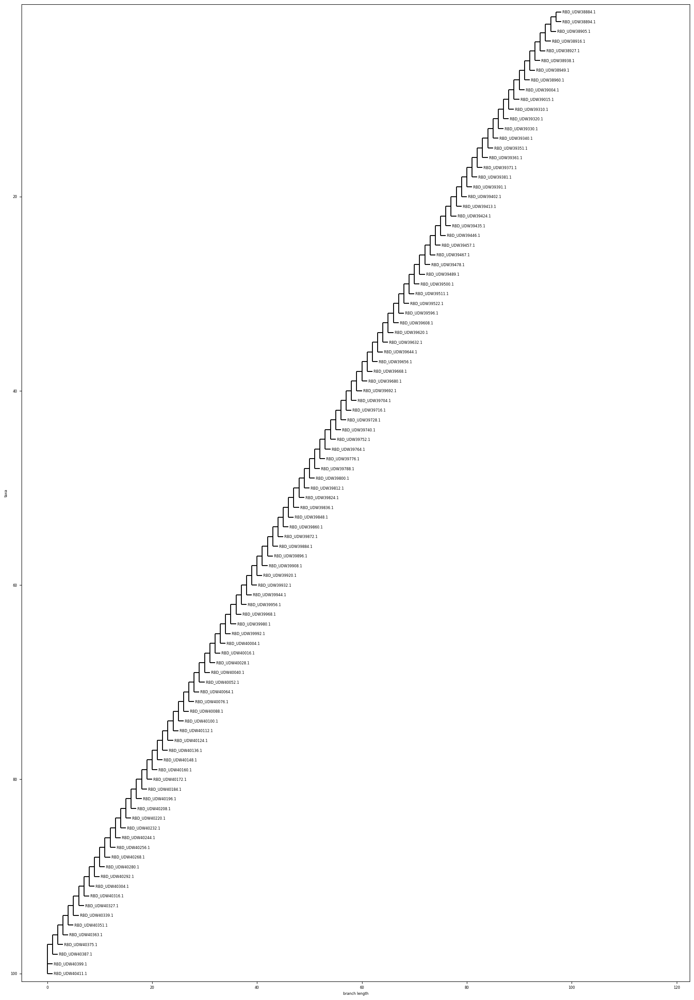

None
Alignment of 05UT:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45122.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45133.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45232.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45243.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48052.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56210.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56570.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58536.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58569.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58591.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW58988.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61529.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61540.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61748.1
RVQPTESIVRF

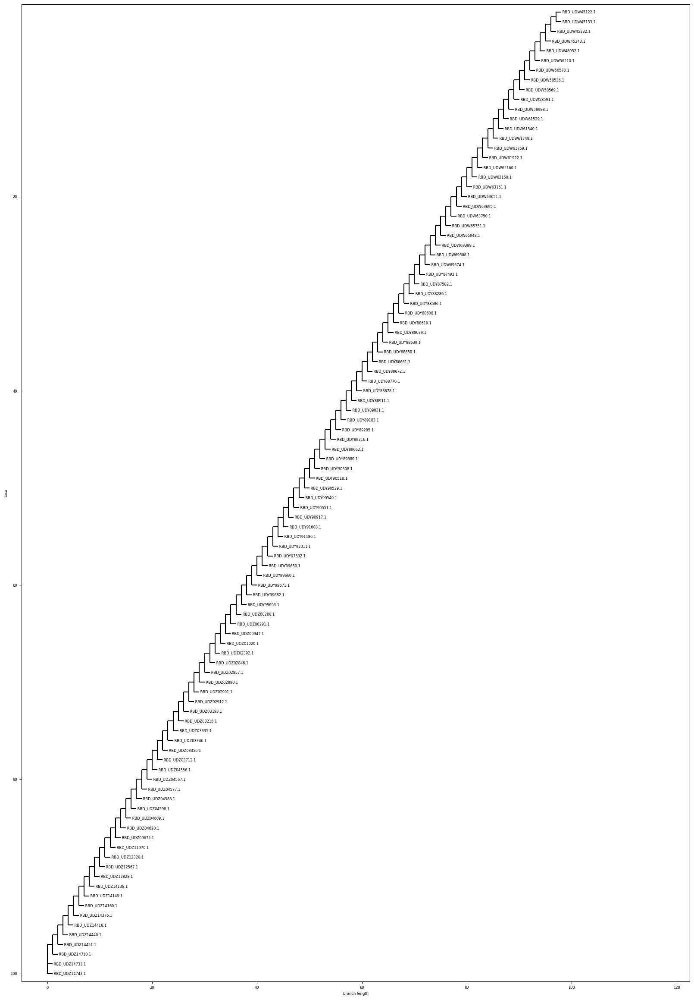

None
Alignment of 05VT:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56994.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57005.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ07427.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ16489.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ18931.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ22856.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39390.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39401.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39412.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39423.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39434.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39445.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39456.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU39467.1
RVQPTESIVRF

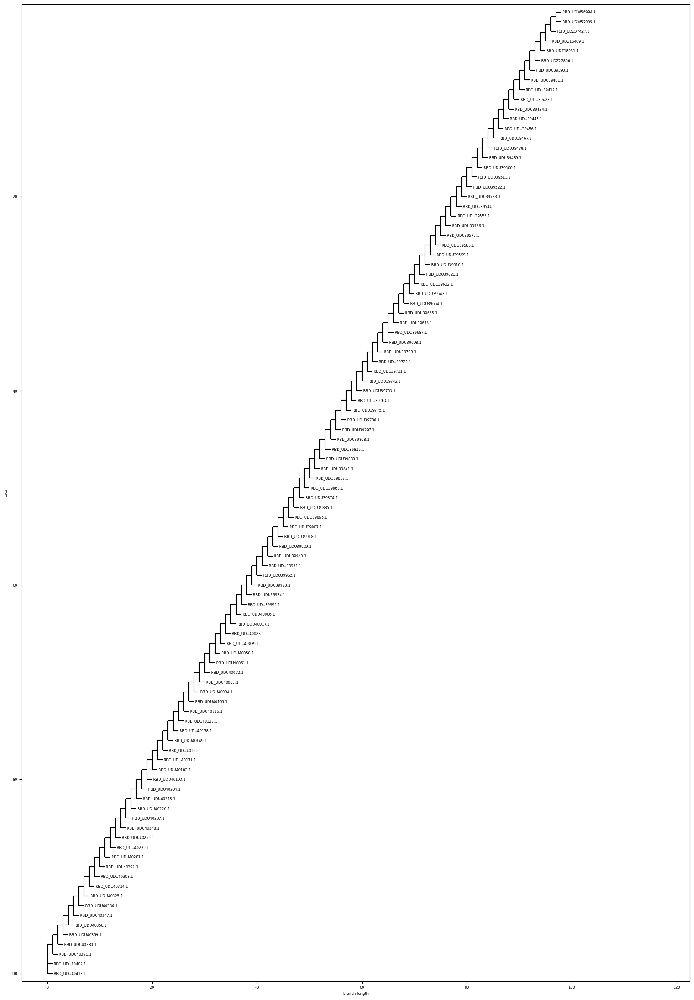

None
Alignment of 05VA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48325.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50798.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51335.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51346.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51357.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW51846.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52110.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53320.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56515.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW56832.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57464.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57670.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW57802.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60545.1
RVQPTESIVRF

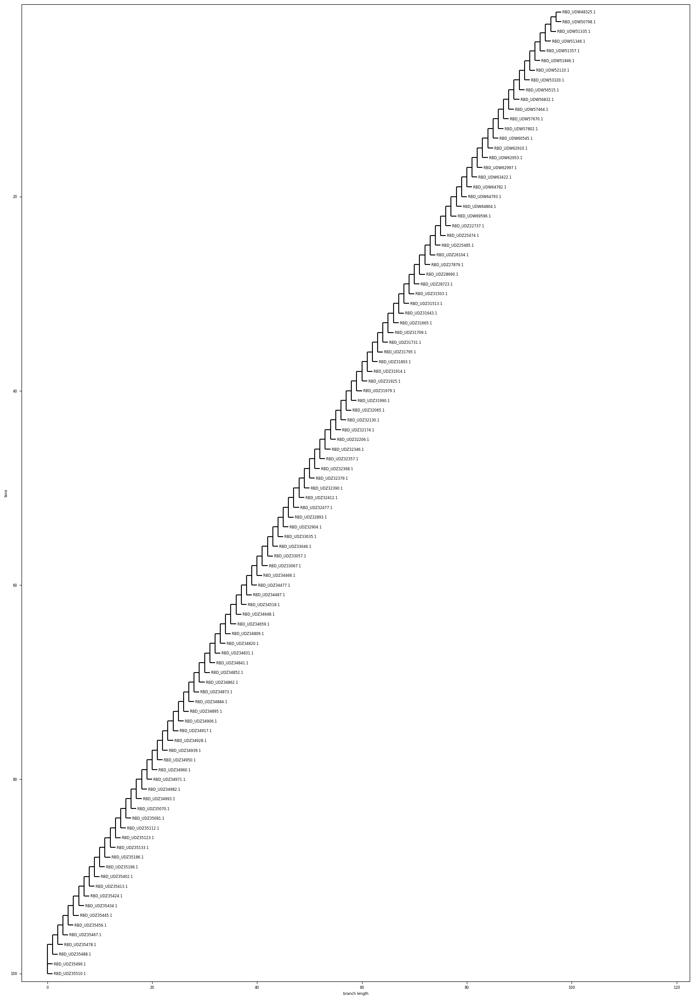

None
Alignment of 05WA:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW44235.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW44259.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59033.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW68652.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY87258.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY89042.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY90010.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY91175.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDY99206.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ00860.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ07936.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ08277.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09899.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ09910.1
RVQPTESIVRF

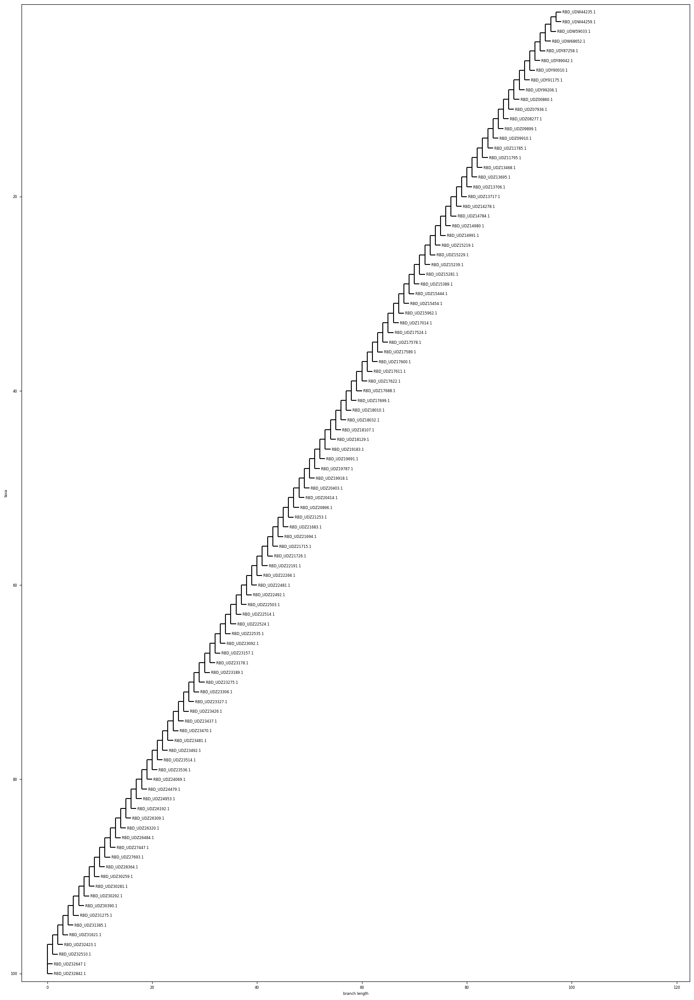

None
Alignment of 05WV:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45791.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45878.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW50511.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52099.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW52802.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53573.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53617.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW53694.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54023.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54121.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54916.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW54927.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59867.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60347.1
RVQPTESIVRF

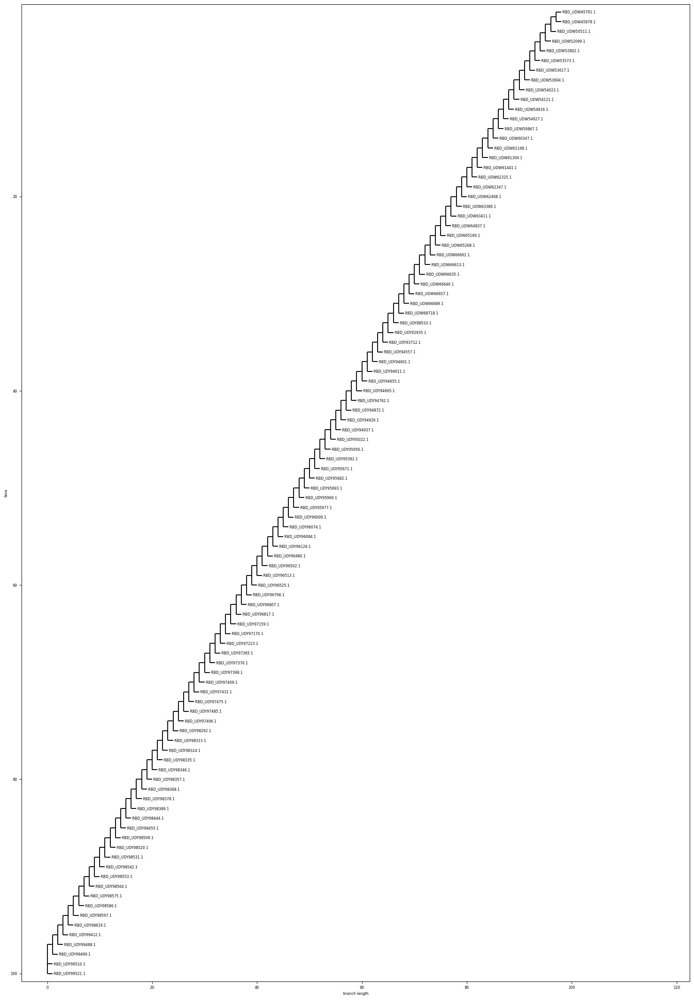

None
Alignment of 05WI:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41148.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45067.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45276.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45529.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45551.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45562.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45748.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45900.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46149.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46160.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46412.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47602.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47613.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW47624.1
RVQPTESIVRF

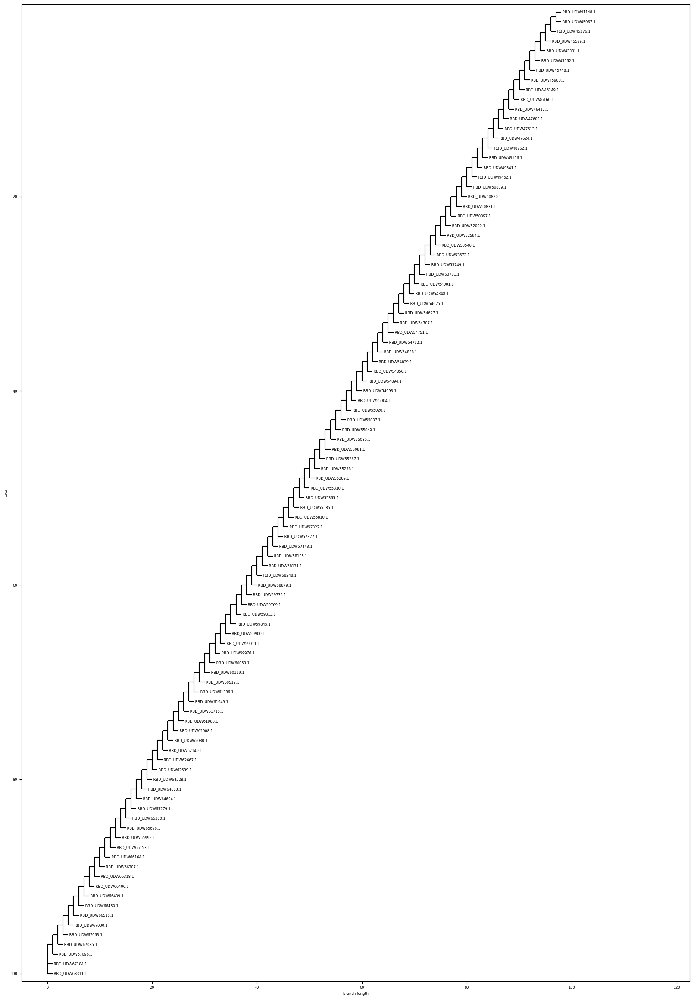

None
Alignment of 05WY:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45441.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW48937.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW49177.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59167.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW59691.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW60908.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW61408.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ12351.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ14267.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ27770.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDZ30107.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU66795.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU67071.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDU67235.1
RVQPTESIVRF

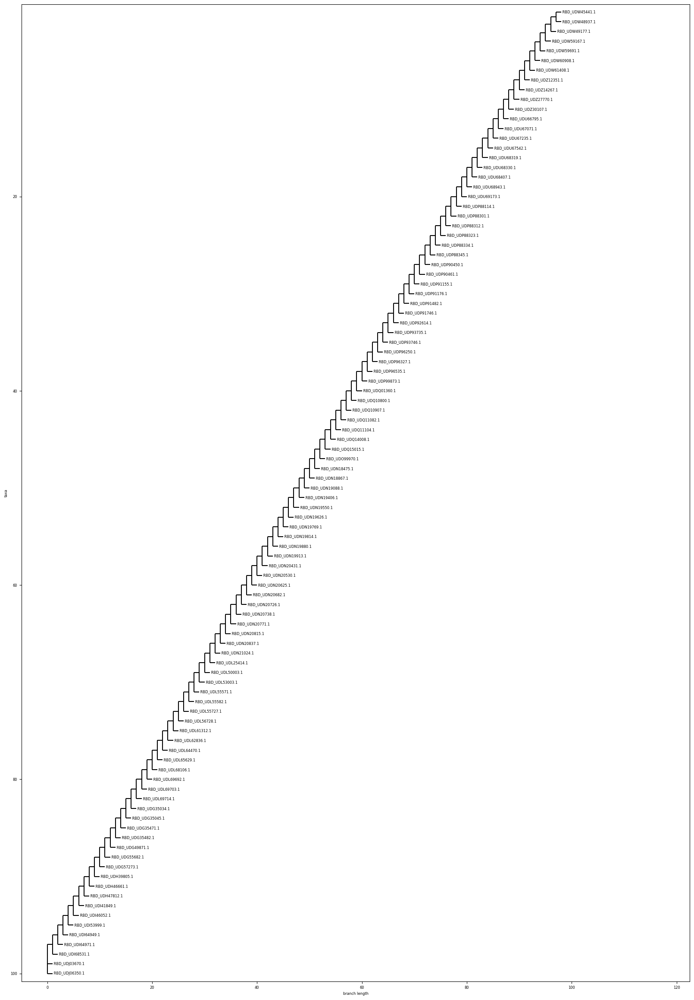

None
Alignment of 02northeastFile:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39069.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41531.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45111.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45397.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45430.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45682.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45802.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45813.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46248.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46346.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46357.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46467.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46488.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW46565.1


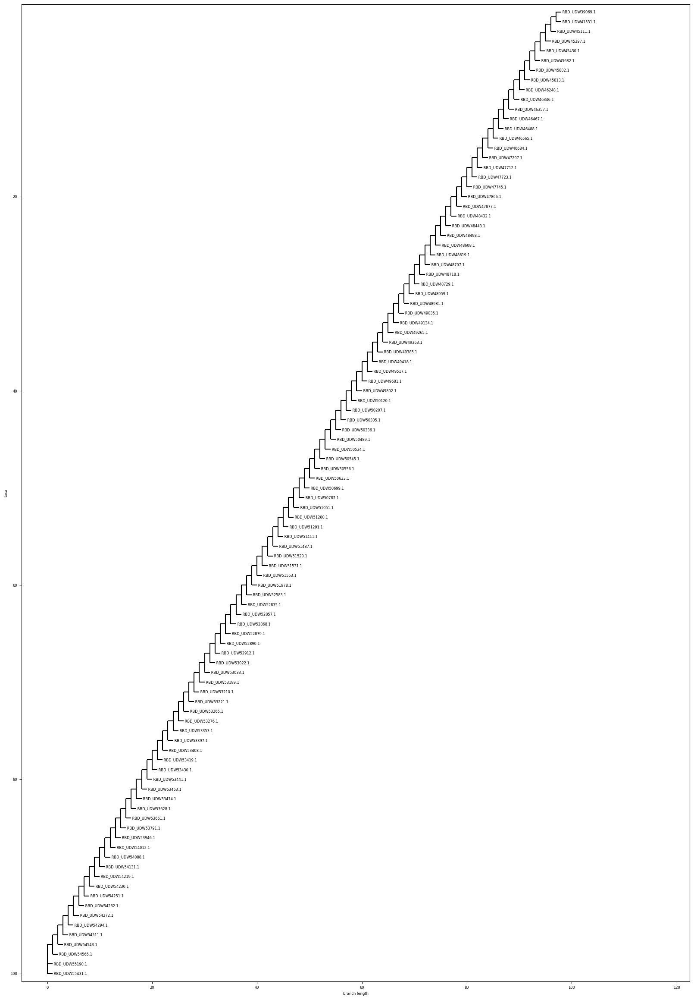

None
Alignment of 02southeastFile:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38231.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38242.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38252.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38263.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38274.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38285.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38296.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38307.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38318.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38329.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38339.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38350.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38361.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38372.1


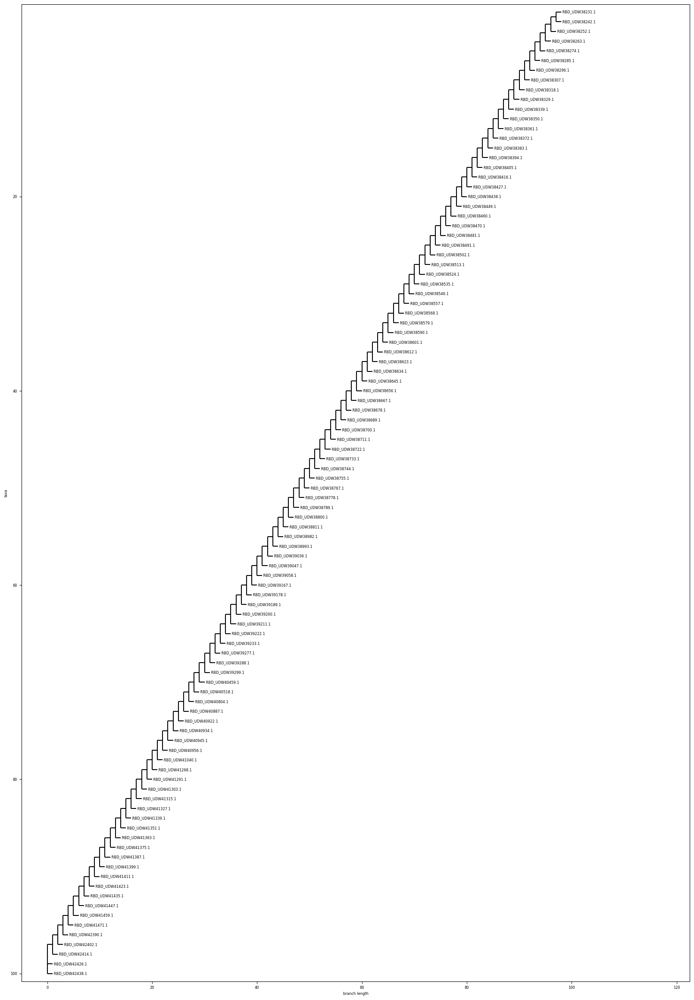

None
Alignment of 02southwestFile:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38884.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38894.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38905.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38916.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38927.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38938.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38949.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38960.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39004.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39015.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39310.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39320.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39330.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39340.1


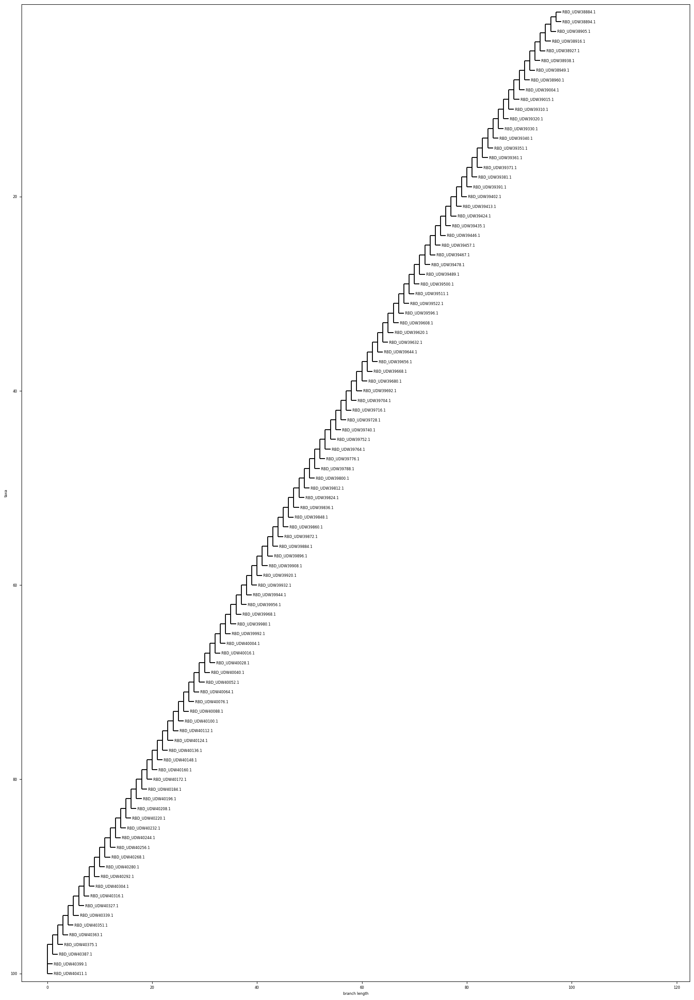

None
Alignment of 02moutainFile:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38971.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39025.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39244.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39255.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39266.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40435.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40470.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40506.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40577.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40601.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40613.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40624.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40648.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40660.1
RV

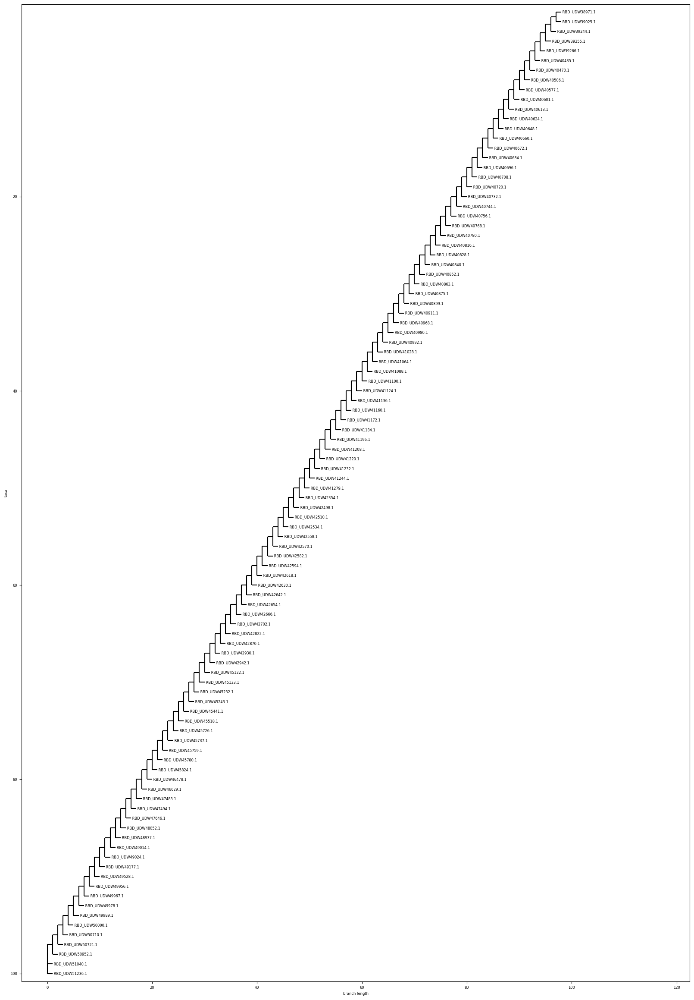

None
Alignment of 02midwestFile:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40447.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41148.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW41519.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW43565.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW44979.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45001.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45034.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45056.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45067.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45144.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45155.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45177.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45221.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45254.1
RV

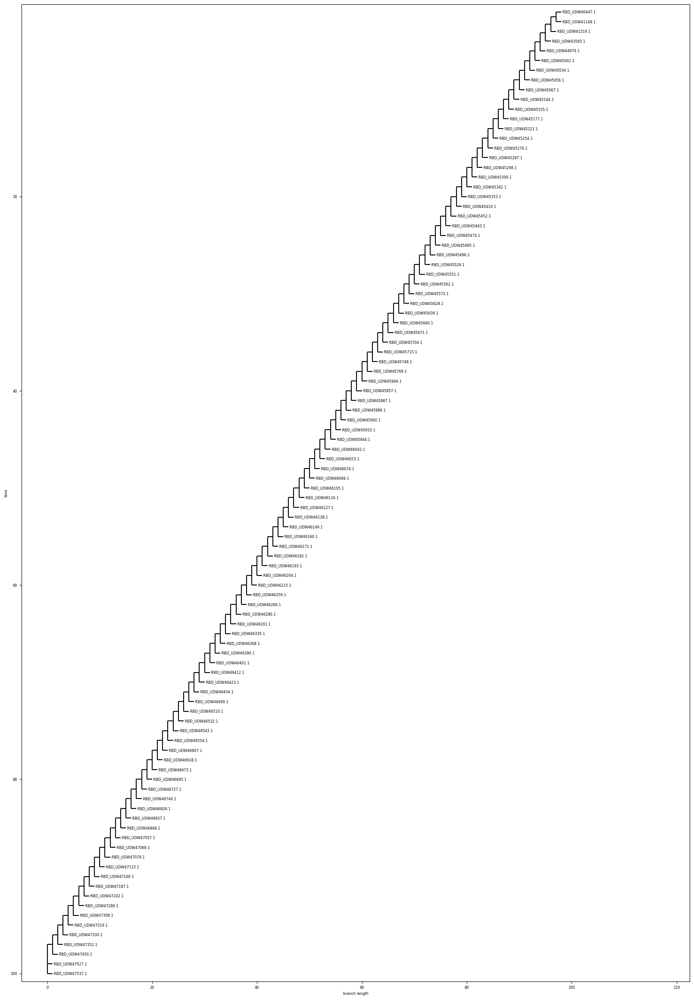

None
Alignment of 02pacificFile:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39080.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39092.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39103.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39113.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39123.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39134.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39145.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39156.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39533.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39543.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39554.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39565.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39575.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39586.1
RV

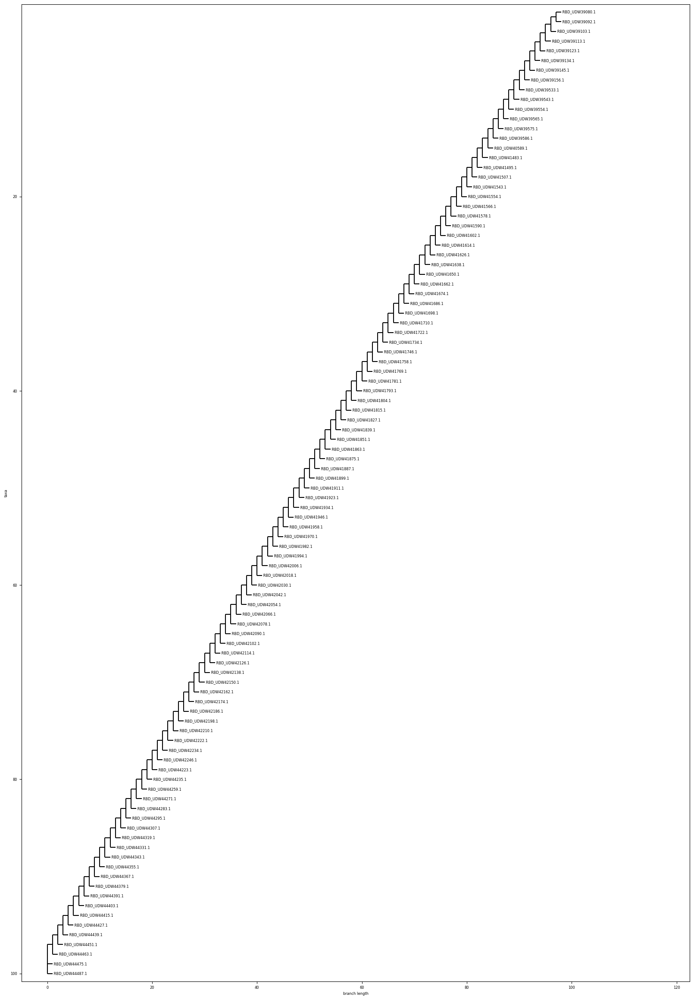

None
Alignment of 04statesWithNoMaskMandate:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38982.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38993.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39036.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39047.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39058.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39167.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39178.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39189.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39200.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39211.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39222.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39233.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39277.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_U

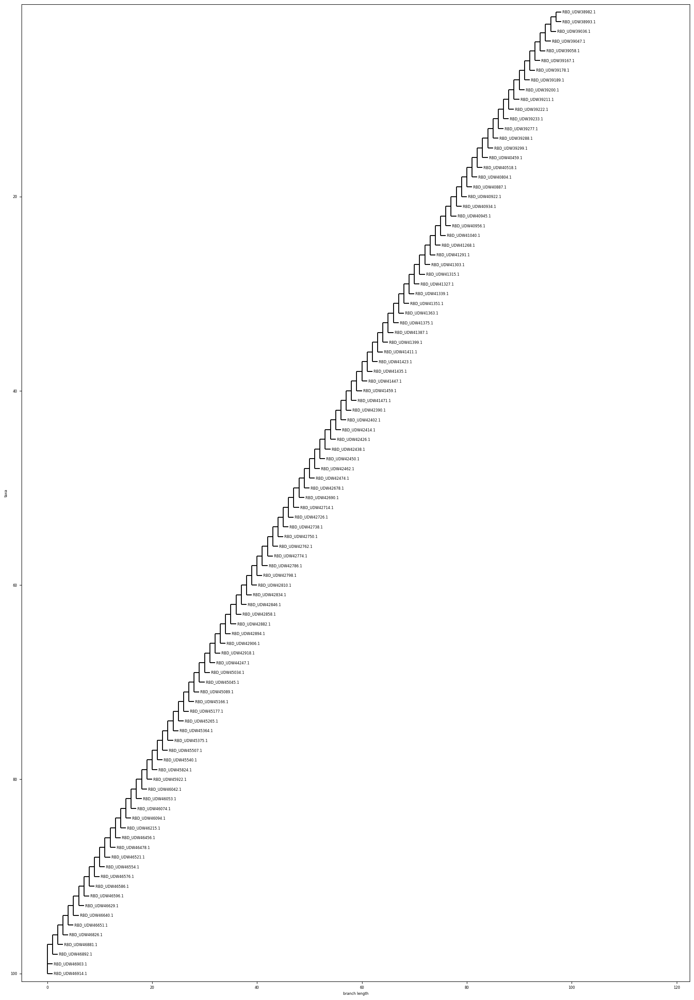

None
Alignment of 04statesWithLimitedOutdoorGather:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38971.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39025.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39069.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39080.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39092.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39103.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39113.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39123.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39134.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39145.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39156.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39244.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39255.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VN

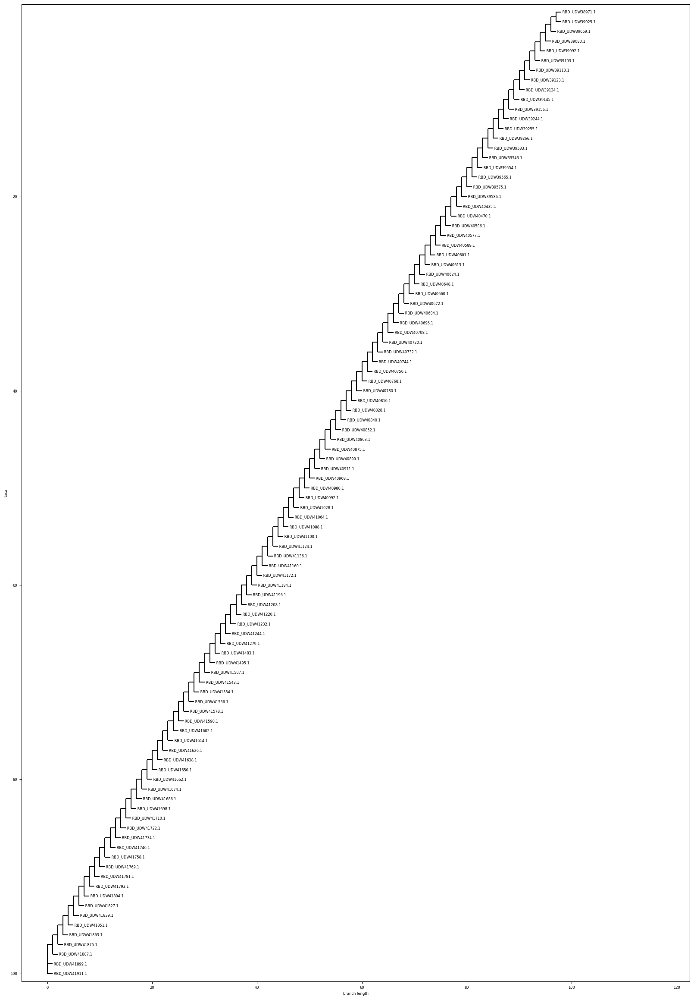

None
Alignment of 04statesWithLowVaccination:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW40447.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW44247.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45023.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45089.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45287.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45298.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45309.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45342.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45353.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45441.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45452.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45463.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW45474.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_

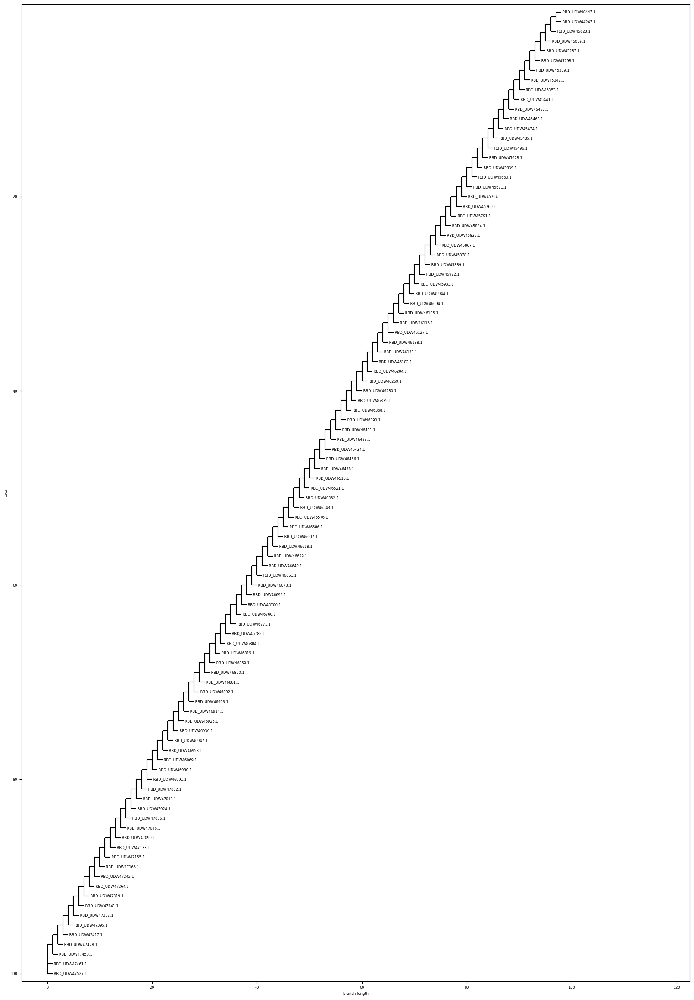

None
Alignment of 04statesWithHighVaccination:

Alignment with 100 rows and 223 columns
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW38971.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39025.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39080.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39092.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39103.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39113.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39123.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39134.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39145.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39156.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39244.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39255.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD_UDW39266.1
RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCV...VNF RBD

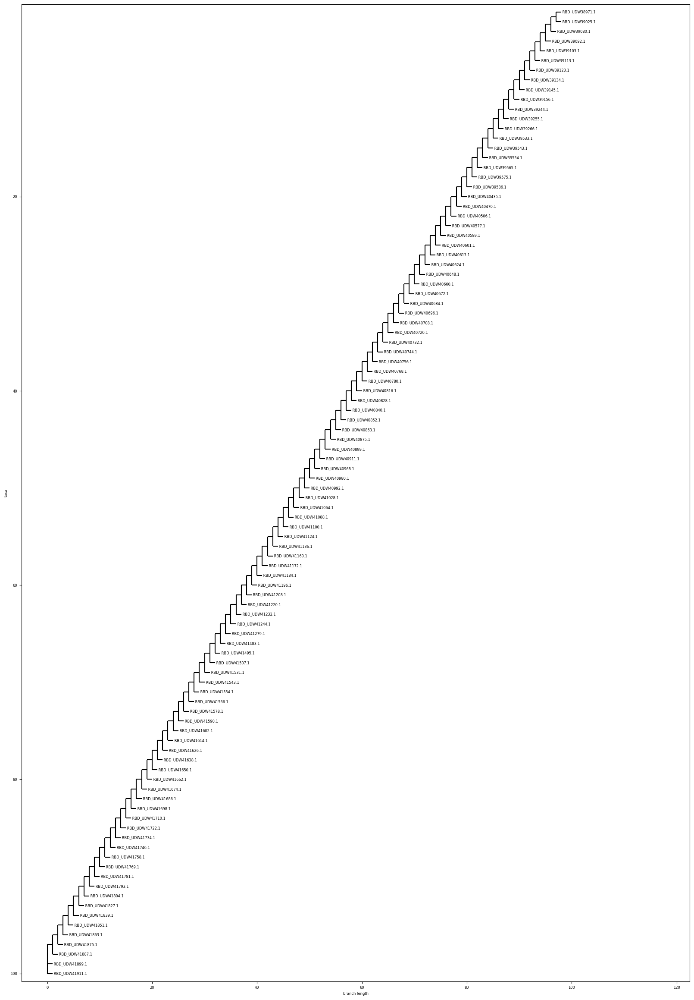

None


In [101]:
from Bio import SeqIO
makeFiles(ALLSURFGLYCPATH)
